# 🟢 Primer modelo encoder decoder con clip base que genera textos

## Entrenamiento

In [3]:
# Importar modelos y tokenizadores de transformers
from transformers import CLIPModel, CLIPTokenizer
from transformers import T5ForConditionalGeneration, T5Tokenizer
import torch
import torch.nn as nn
import pytorch_lightning as pl
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from torch.utils.data import Dataset, DataLoader
import json
import os
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from evaluate import load
import re
import matplotlib.pyplot as plt

# Definición del modelo que combina CLIP y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo CLIP preentrenado
        self.clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        # Cambiar la dimensión de 768 (salida de CLIP) a 768 (entrada de T5-base)
        self.linear = nn.Linear(768, 768)

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Obtener características de la imagen usando CLIP
        clip_outputs = self.clip.vision_model(pixel_values=pixel_values)
        # Adaptar las dimensiones de las características de CLIP de 768 a 768
        adapted_encoder_outputs = self.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        # Añadir una dimensión si es necesario (para el batch) para que encajen los tensores
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=(visual_features,),
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, img_dir, tokenizer, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.img_dir = img_dir  # Directorio donde se encuentran las imágenes
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos
        # Transformaciones para preprocesar las imágenes
        self.transforms = Compose([
            Resize((224, 224)),  # Redimensionar a 224x224
            ToTensor(),  # Convertir a tensor
            Normalize(mean=[0.48145466, 0.4578275, 0.40821073], std=[0.26862954, 0.26130258, 0.27577711])  # Normalizar con la media y desviación estándar de CLIP
        ])

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        # Construir la ruta de la imagen correspondiente al tweet
        img_filename = tweet_id + ".jpg"
        img_path = os.path.join(self.img_dir, img_filename)
        # Cargar la imagen y aplicarle las transformaciones
        image = Image.open(img_path).convert('RGB')
        image = self.transforms(image)

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "pixel_values": image,
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina CLIP y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Tokenizador de T5
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(pixel_values=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
                # Predicción del siguiente token
                generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
                generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
                reference_text = batch['tweet_text'][0]

                print(f"Step {batch_idx}:")
                print(f"Texto original: {reference_text}")
                print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        adapted_encoder_outputs = self.model.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)


        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=clip_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        
        # Calcular la puntuación BLEU
        #generated_ids = self.model.t5.generate(encoder_outputs=clip_outputs) 
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss



    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        adapted_encoder_outputs = self.model.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=clip_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss


    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False)  # Usar el comportamiento nuevo del tokenizador
    img_dir = "./img_resized"

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, img_dir, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, img_dir, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision='16-mixed',  # Precisión flotante de 16 bits para reducir el uso de memoria
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()



In [ ]:
# Ejecutar el flujo principal
torch.cuda.set_device(1)  # Seleccionar GPU 1
main()

## Testeo

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


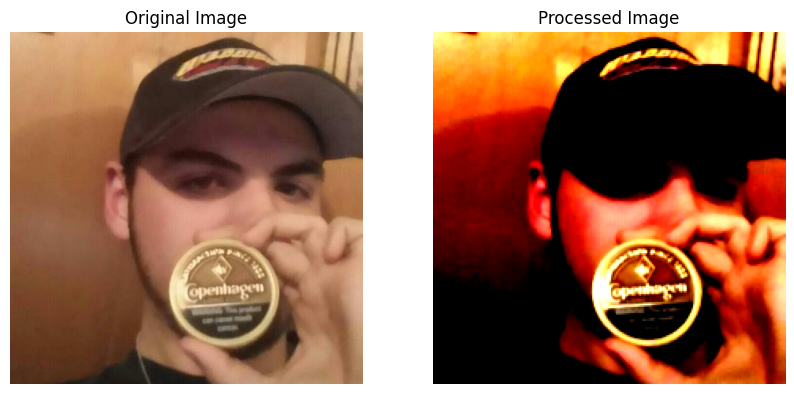

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 1625:
Texto real:  🙌 YASSS It's time for a great show countryfied redneck:sitting outsid https://t.co/Vwp6Mfv3W7 https://t.co/kCqISIIYxY
Texto generado:  in a way that makes a difference in the way we do our jobs. We have a responsibility to do this........................................s................



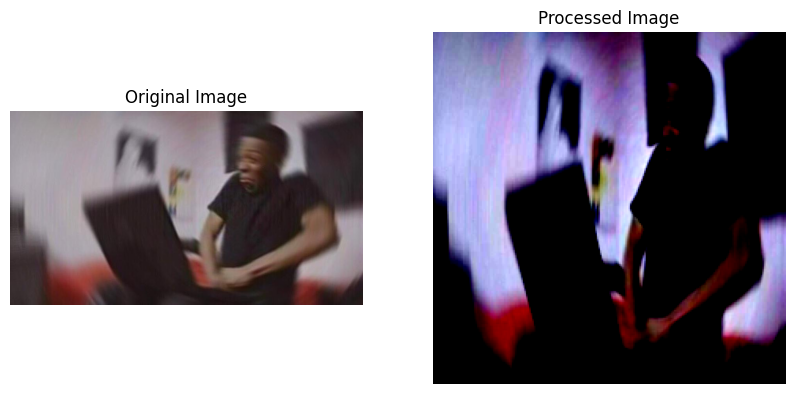

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 8413:
Texto real:  WHO THE HELL TOLD YOONGI TO COME IN WITH THAT DEEP ASS NIGGA VOICE https://t.co/Fojw29EUNK
Texto generado:  in a building, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the, we made the,



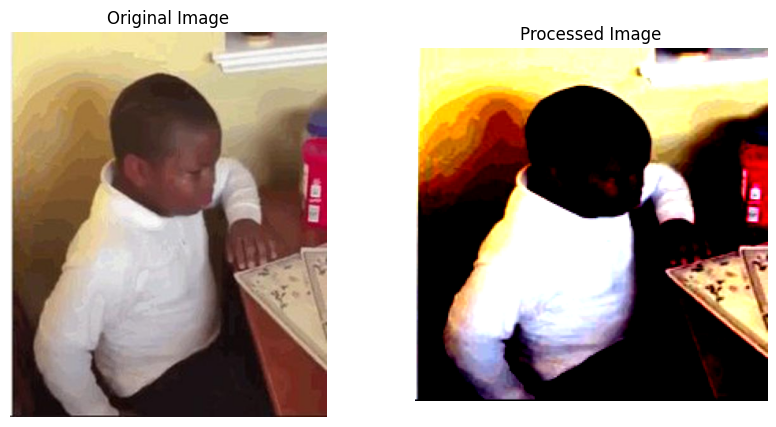

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 8253:
Texto real:  @dababydahl I know nigga damn https://t.co/tvyxy3pFYC
Texto generado:  -----s---------s---- a combustible a combustible is a combustible is a combustible is a combustible is a combustible is a combustible is a combustible a  s



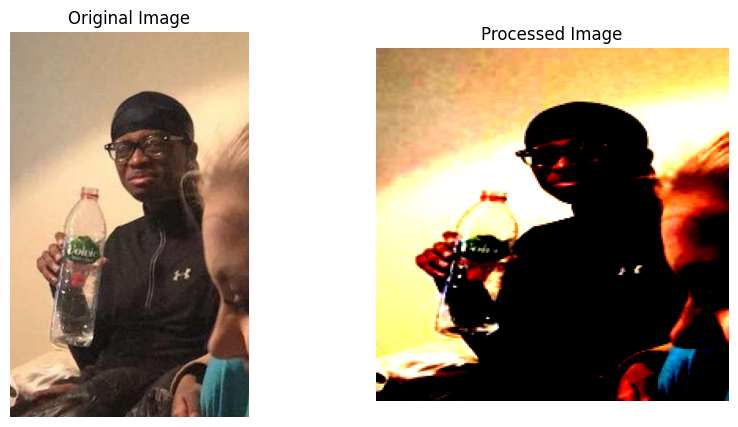

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 6703:
Texto real:  @Zuzi_SongBird 🤨 that’s not the type of sad nigga hours I mean https://t.co/Zs6CcJOq1q
Texto generado:  hat tasked with identifying and identifying the three tiers of the 'committee' that is responsible for the 'committee'. The tasked tasked with identifying and identifying the three tiers of responsibility.



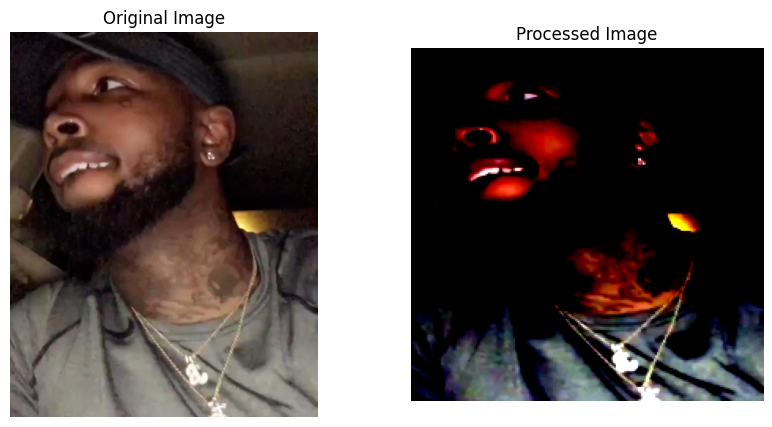

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 5865:
Texto real:  “Ta keep it lit this a solid nigga💎✨ you fuckin wit aye😏🤞🏾”  .. I’m dropping this soon 🥰 https://t.co/8oHa6KYp5T
Texto generado:  Earlier this year, the government acted in the capacity of a statutory duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty duty responsibility



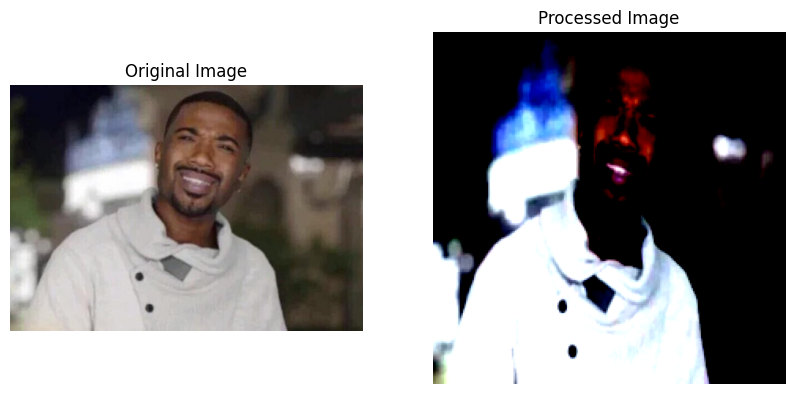

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 7752:
Texto real:  She demands you to take her out, then you take her to Nandos #AndThenJikiJiki she says you a broke ass nigger https://t.co/FUjT6yipmP
Texto generado:  -s were made to last..........s..-ing-capability..-capability..-capability..-capability..------..........s.. a twat of a twat..s..s.. a t



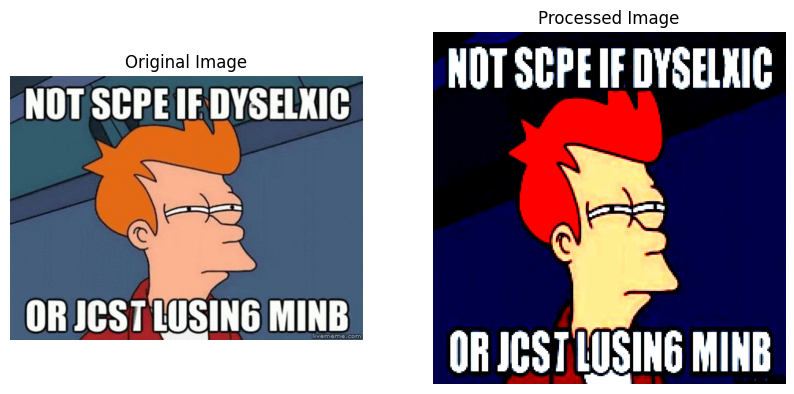

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 469:
Texto real:  @BBCNews Anybody who spells their name with two n's is basically a.... Twat. https://t.co/XymtLMiG1d
Texto generado:  t a half-mile in a half-mile,,-- in a half-mile,ing in a half-mile,ing in a half-mile, of ofnt,,,...nt in a half-mile,.- in a half-mile. in a half-mile... The. The twat. The



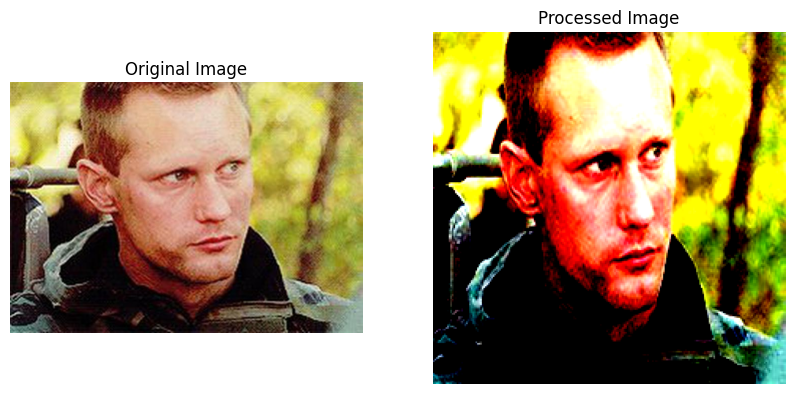

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 96:
Texto real:  @Menethas This is so colossally retarded, I can't even say anything about it. https://t.co/BNESNfKc7B
Texto generado:  ---response is based on a duty of care. The duty of care is based on a duty of care. The duty of care is based on a duty of care. The duty of care is based on a duty of care. The responsibilities of a duty of care.



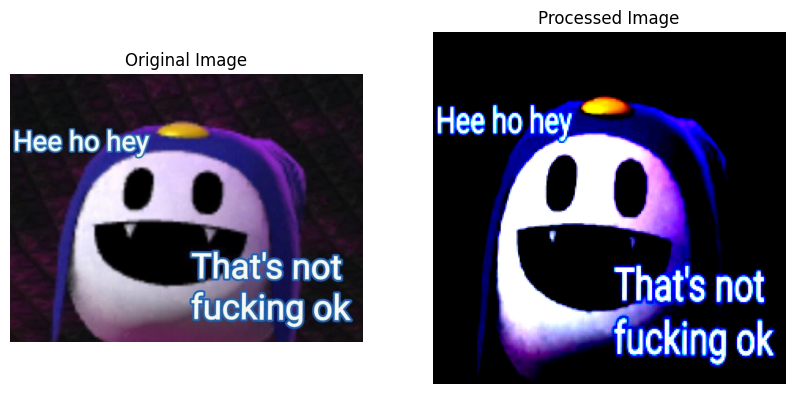

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 9372:
Texto real:  @OrwellNGoode Nigga...  I’m still struggling to get a house of my own. Chill crazy ass lady. https://t.co/rWjp1sVx2b
Texto generado:  a twat...................................... a twat..



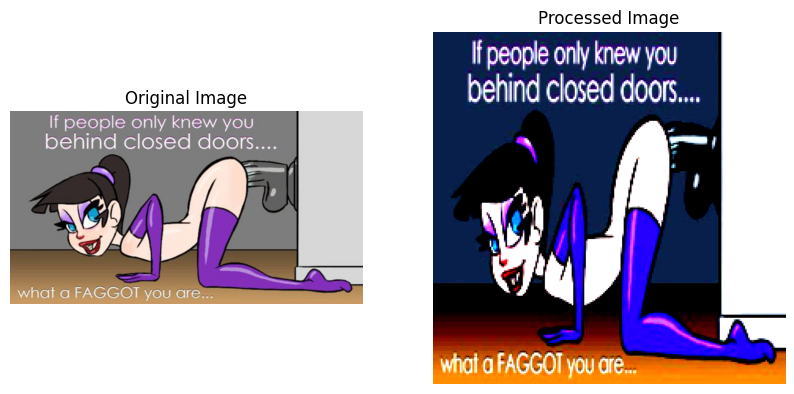

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 4865:
Texto real:  #ThingsYouShouldNeverAssume I know what a #dirty #little #weak #faggot you are! #FinDom #FemDom #SPH #CBT https://t.co/dAMYtCdqj8
Texto generado:  ........................



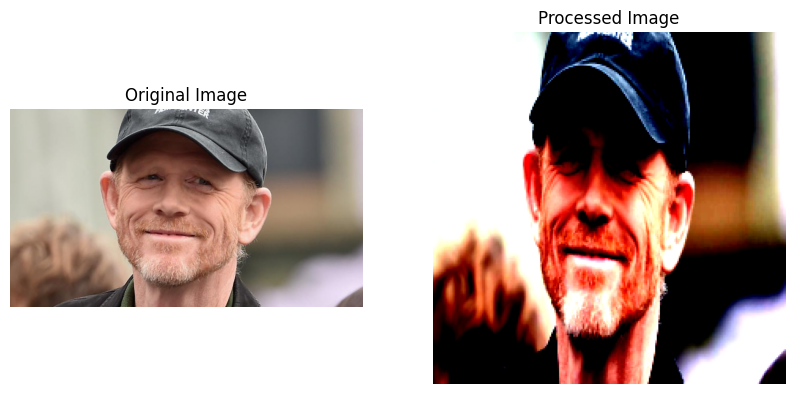

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 7046:
Texto real:  Ron Howard is back in Middletown, the setting of upcoming 'Hillbilly Elegy' adaptation https://t.co/Nq2ApZz8K2 https://t.co/JD7vEydupG
Texto generado:  ---recognition-capability and- and-capability-recognition-capability-as-certainment-capability-as-certainment-s---- of--s-,-,-------as-----as---as---as



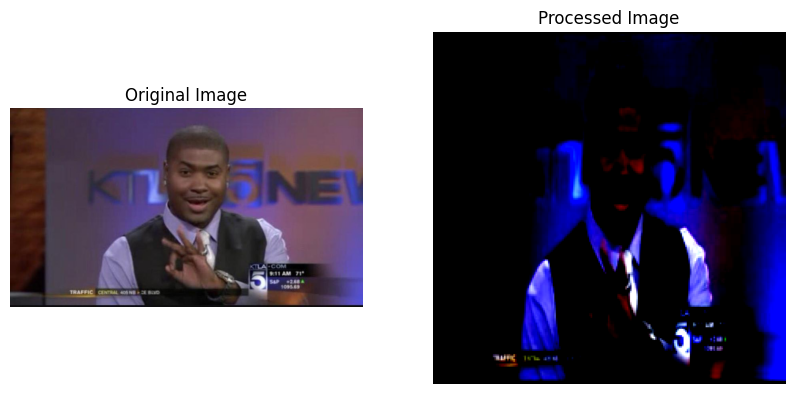

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 5234:
Texto real:  @tariqnasheed You better wash yo ass you dumbass faggot https://t.co/xhPeavJ4Bg
Texto generado:  ---s have---related problems have been identified.-related problems have been identified.-related problems have been identified.-related problems were-related problems were--related problems were-related problems were-related problems were-related problems were-related problems-related problems were--related problems were--------related problems have been referred to as'se



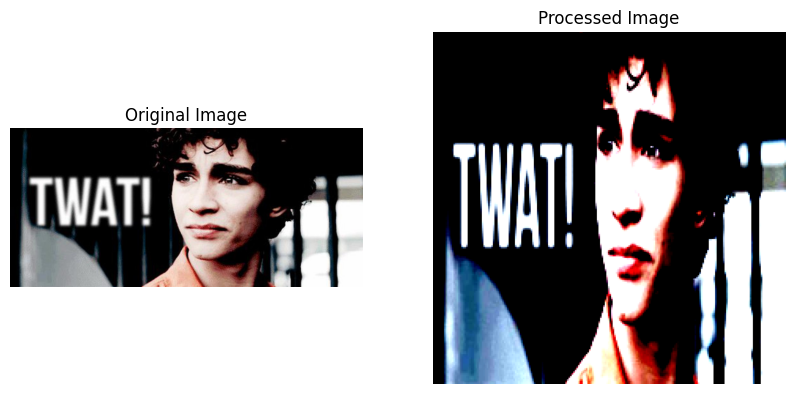

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 6787:
Texto real:  Twat waffles  #RuinAFoodOrDrink https://t.co/1wjwRm8pbD
Texto generado:  in a way that makes sense. It makes sense. It makes sense. It makes sense. It makes sense. It makes sense. It makes sense. It makes sense. It makes sense. It makes sense.



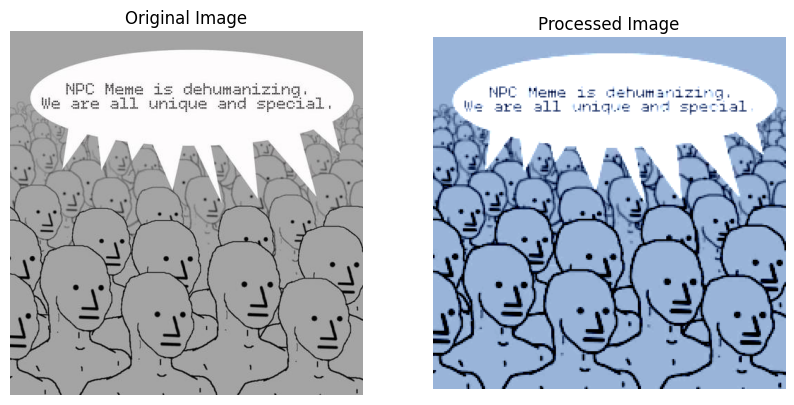

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Ejemplo 5663:
Texto real:  @CubanBread @CaraSantaMaria Ok I'll stop would you prefer SJW NPC? REEEEEEEEE!!!!!! https://t.co/CA1yJH8EVQ
Texto generado:  ............



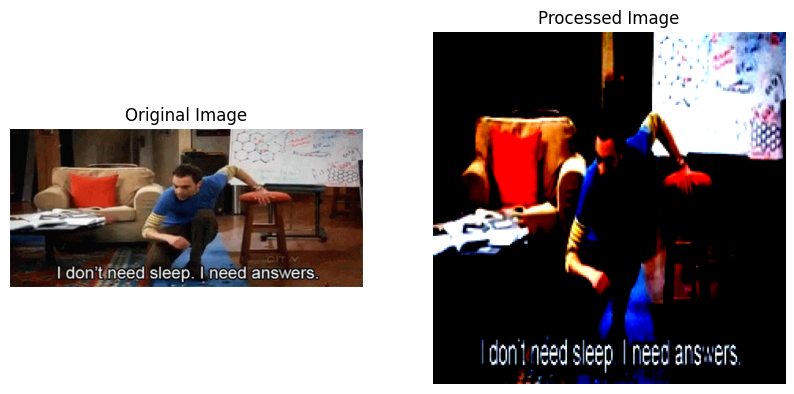

Ejemplo 6323:
Texto real:  my brain after i drink coffee at night, then try to sleep and am all of a sudden a conspiracy theorist: https://t.co/5H9gJdjJB0
Texto generado:  Earlier this year, a spokesman for the terabyte, describing the nature of the commotion. The commotion is part of the terabyte. The commotion is part of the commotion.



In [3]:
# Seleccionar la GPU 1 (que será la única visible y será indexada como 0)
torch.cuda.set_device(1)

import random
from transformers import T5Tokenizer
import torch
import json
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

# Función para cargar datos
def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    return data, id_test

# Función para mostrar las imágenes
def show_images(original_image, processed_image):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(processed_image.permute(1, 2, 0).cpu().numpy())
    axs[1].set_title("Processed Image")
    axs[1].axis('off')

    plt.show()

# Función para probar ejemplos del conjunto de prueba
def test_examples(lit_model, tokenizer, test_dataset, data, num_examples = 5):
    lit_model.eval()
    lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

    # Seleccionar N ejemplos aleatorios del conjunto de prueba
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        pixel_values = sample['pixel_values'].unsqueeze(0).to(lit_model.device)

        # Obtener el texto real del tweet
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        # Mostrar imagen original y procesada
        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')
        processed_image = sample['pixel_values']

        show_images(original_image, processed_image)

        # Generar texto a partir de la imagen
        with torch.no_grad():
            # Obtener representaciones visuales del modelo CLIP
            clip_outputs = lit_model.model.clip.vision_model(pixel_values=pixel_values)
            visual_features = lit_model.model.linear(clip_outputs.last_hidden_state)

            if visual_features.ndim == 2:
                visual_features = visual_features.unsqueeze(1) 
                
            
                       
            # Generar IDs de texto usando el decodificador T5 con las representaciones visuales como entradas
            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=clip_outputs,#(visual_features,), #ENCODER OUTPUTS, NO INPUT EMBEDS
                max_length=128,
                num_beams=4,
                early_stopping=True
            )

            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Comparar el texto generado con el texto real
        print(f"Ejemplo {i+1}:")
        print("Texto real: ", tweet_text)
        print("Texto generado: ", generated_text)
        print()

# Ruta base
base_path = "./"

# Cargar datos y tokenizer
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Usar el tokenizador de t5-base
img_dir = "./img_resized"

# Crear diccionario de datos para el conjunto de prueba
dict_test = {x: data[x] for x in id_test if x in data}
test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer)

# Cargar el modelo entrenado
model = VisionTextModel()
checkpoint_path = "checkpoints/model-epoch=02-val_loss=0.49-first-working.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

# Probar el modelo con 5 ejemplos
test_examples(lit_model, tokenizer, test_dataset, data, 15)


# 🟢 Repetición sin normalizar pixeles

In [1]:
# Importar modelos y tokenizadores de transformers
from transformers import CLIPModel, CLIPTokenizer
from transformers import T5ForConditionalGeneration, T5Tokenizer
import torch
import torch.nn as nn
import pytorch_lightning as pl
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor
from torch.utils.data import Dataset, DataLoader
import json
import os
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from evaluate import load
import re
import matplotlib.pyplot as plt

# Definición del modelo que combina CLIP y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo CLIP preentrenado
        self.clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        # Cambiar la dimensión de 768 (salida de CLIP) a 768 (entrada de T5-base)
        self.linear = nn.Linear(768, 768)

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Obtener características de la imagen usando CLIP
        clip_outputs = self.clip.vision_model(pixel_values=pixel_values)
        # Adaptar las dimensiones de las características de CLIP de 768 a 768
        adapted_encoder_outputs = self.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        # Añadir una dimensión si es necesario (para el batch) para que encajen los tensores
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=(visual_features,),
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, img_dir, tokenizer, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.img_dir = img_dir  # Directorio donde se encuentran las imágenes
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos
        # Transformaciones para preprocesar las imágenes
        self.transforms = Compose([
            Resize((224, 224)),  # Redimensionar a 224x224
            ToTensor()  # Convertir a tensor
        ])

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        # Construir la ruta de la imagen correspondiente al tweet
        img_filename = tweet_id + ".jpg"
        img_path = os.path.join(self.img_dir, img_filename)
        # Cargar la imagen y aplicarle las transformaciones
        image = Image.open(img_path).convert('RGB')
        image = self.transforms(image)

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "pixel_values": image,
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina CLIP y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Tokenizador de T5
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(pixel_values=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
                # Predicción del siguiente token
                generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
                generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
                reference_text = batch['tweet_text'][0]

                print(f"Step {batch_idx}:")
                print(f"Texto original: {reference_text}")
                print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        adapted_encoder_outputs = self.model.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=clip_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        adapted_encoder_outputs = self.model.linear(clip_outputs.last_hidden_state)
        visual_features = adapted_encoder_outputs

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=clip_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False)  # Usar el comportamiento nuevo del tokenizador
    img_dir = "./img_resized"

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, img_dir, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, img_dir, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=5,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision='16-mixed',  # Precisión flotante de 16 bits para reducir el uso de memoria
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    # Gráfica de Loss
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Gráfica de Perplexity
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.xlabel('Epochs')
    plt.ylabel('Perplexity')
    plt.title('Perplexity over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Gráfica de BLEU
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('BLEU')
    plt.title('BLEU over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

2024-06-21 19:18:38.479098: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-21 19:18:38.527749: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-21 19:18:39.289463: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, y

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1201: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 32. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' doe

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Hey there retard 
Texto generado: Hey there retard! Hey there retard! Hey there retard! Hey there retard! Hey there
Step 100:
Texto original: [USR] Who twat act like this i need that bi polar pussy in my life💦💦💦💦🍑🍑😂 
Texto generado: [USR] Who twat act like this i need that bi
Step 200:
Texto original: My sissy cunt. Love showing it off for [USR] 
Texto generado: My sissy cunt.... My
Step 300:
Texto original: When a Stevenston junkie loses his key .... what a twat .... place is full of roasters 
Texto generado: his key.... what a twat........ a Steven
Step 400:
Texto original: WHO THE FUCK IS THIS NIGGA B?! 😂😂😂🕸🕷 #SpiderManFarFromHome #Brooklyn99 
Texto generado: 
Step 500:
Texto original: [USR] aye nigga I think they ready for this shit 🤘🏾🖤🤯 
Texto generado: aye nigga I think they ready for this shit
Step 600:
Texto original: Tihus nigga bumbin bygee waitin for pitas 
Texto generado: bumbin bygee waitin for pitas. Tihus nig
Step 700:
Texto original: [USR] Whoa n

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Step 0:
Texto original: Miss this nigga that’s the real [USR] 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 100:
Texto original: [USR] You making a real nigga blush 
Texto generado: [USR] You making a real nigga blush. [USR]
Step 200:
Texto original: [USR] NIGGA THATS HER PUNNA 
Texto generado: [USR] NIGGA THATS HER PUNNA THATS HER P
Step 300:
Texto original: Nigga my what??? 
Texto generado: Nigga my what??????????????????????????????????????????
Step 400:
Texto original: Yo nigga can’t guard me 
Texto generado: nigga can’t guard me nigga can’t guard me
Step 500:
Texto original: [USR] Who got this nigga phone 
Texto generado: [USR] Who got this nigga phone? [USR] Who got
Step 600:
Texto original: I really want to know why some guys think it’s okay to send a UNWANTED dick pic. Like nigga wtf?!? 
Texto generado: I really want to know why some guys think it’s okay to send a UN
Step 700:
Texto original: [USR] [USR] As unlikeable as this twat?!? 
Texto generado: [USR] [USR] [USR] As u

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: what in the hillbilly deer huntin’ is going on here 
Texto generado: 
Step 100:
Texto original: OPRAH THE UNCLE TOM HOUSE NIGGA.....IN HER ELEMENT. 
Texto generado: 
Step 200:
Texto original: [USR] Look at the way he walks! This guy is obviously  A) Real &amp;  B) a huge SJW 
Texto generado: [USR] Look at the way he walks! He is A) Real &
Step 300:
Texto original: [USR] [USR] [USR] Omg I hope he wasn’t a twat? 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 400:
Texto original: 4PC – Soutien Nigga Fama (Son 2019)  
Texto generado: Soutien Nigga Fama (Son 2019) (Son 2019)
Step 500:
Texto original: My Arab Nigga need a Set out , He drive a Audi 😂🤟🏾💯 #Ondagang OmOil My Store 💰💰 
Texto generado: #Ondagang OmOil
Step 600:
Texto original: [USR] Remember I'm not a hoe ass nigga if you get pregnant and we agreed to fuck raw 
Texto generado: [USR] Remember I'm not a hoe ass nigga
Step 700:
Texto original: Me when a white person says nigga 
Texto generado: nigga nigga 

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: [USR] this nigga nearly came when Gohn hit him i- 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 100:
Texto original: [USR] My apologies from one of the only 200 or so Canadians left that aren't feminazi's 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 200:
Texto original: [USR] Jelly face NIGGA‼️ 
Texto generado: [USR] Jelly face NIGGA!!
Step 300:
Texto original: “THE DMV” Pffff! , no Faggot it’s all about DC FUHH NIGGA! 
Texto generado: , no Faggot it’s all about DC FUHH NIGGA!
Step 400:
Texto original: “Real ass bitch, give a fuck 'bout a nigga...”  Me: 
Texto generado: “Real ass bitch, give a fuck 'bout
Step 500:
Texto original: no one:  gang when we linked up: REAL ASS BITCH GIVE A FUCK ABOUT A NIGGA 
Texto generado: gang when we linked up: REAL ASS BITCH GIVE A FUCK
Step 600:
Texto original: Can redneck shit-kickers afford Nikes in the first place? Don't they mainly wear things like this:   #NikeBoycott 
Texto generado: #NikeBoycott? #NikeBoycott #

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: [USR] LMAOOOOOOOOOOOOOOOOOO this nigger needs to be stopped 
Texto generado: nigger needs to be stopped.
Step 100:
Texto original: [USR] Punch this guy in the cunt! 
Texto generado: [USR] Punch this guy in the cunt!
Step 200:
Texto original: She cum hard when her nigga fuck like she been bad 
Texto generado: She cum hard when her nigga fuck like she been bad nigg
Step 300:
Texto original: Nigger tings 
Texto generado: Nigger tings tings tings tings tings ting
Step 400:
Texto original: Seafood basket twat😎😍😍 
Texto generado: Seafood basket twat
Step 500:
Texto original: 📻▶️SURRENDER - [USR] FT [USR]   on the  #TheHipHopRide with   [USR]     #HustleMonday 
Texto generado: SURRENDER - [USR] FT [USR] on
Step 600:
Texto original: New Job Nigger 
Texto generado: New Job Nigger Nigger Nigger Nigger Nigger Nigger Nigger Nigger Ni
Step 700:
Texto original: NEXT TIME I DM A BINT FOR MARRIAGE  I WILL START WITH THIS 
Texto generado: NEXT TIME I DM A BINT FOR MARRIAGE I WIL

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=5` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │            0.0            │
│         test_loss         │    0.4796566963195801     │
│      test_perplexity      │    1.6176725625991821     │
└───────────────────────────┴───────────────────────────┘

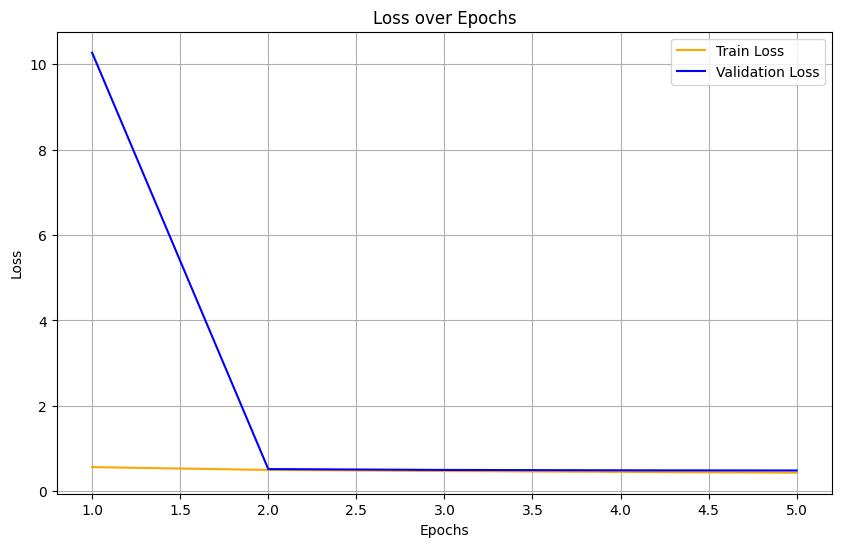

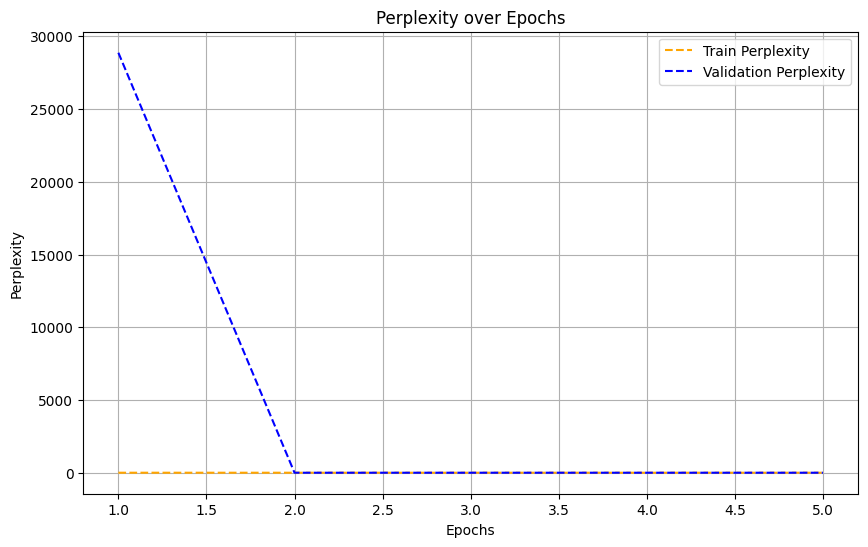

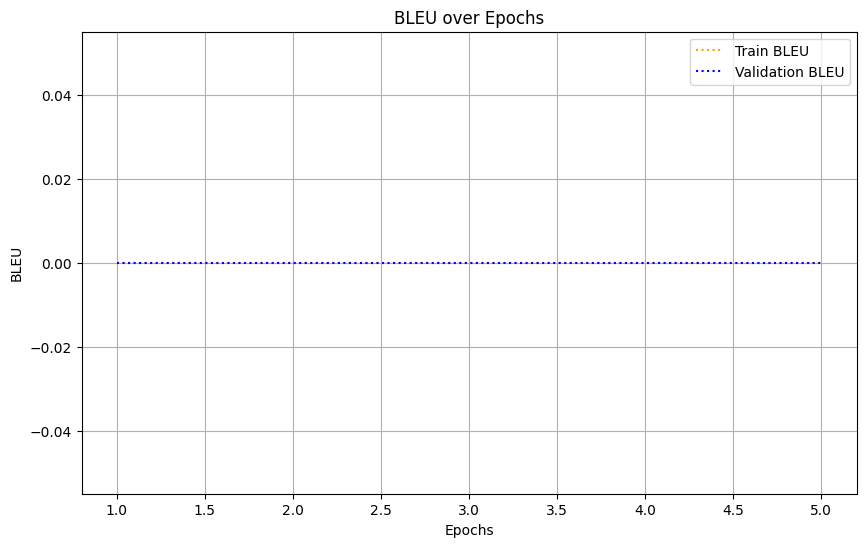

In [2]:
# Ejecutar el flujo principal
torch.cuda.set_device(1)  # Seleccionar GPU 1
main()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


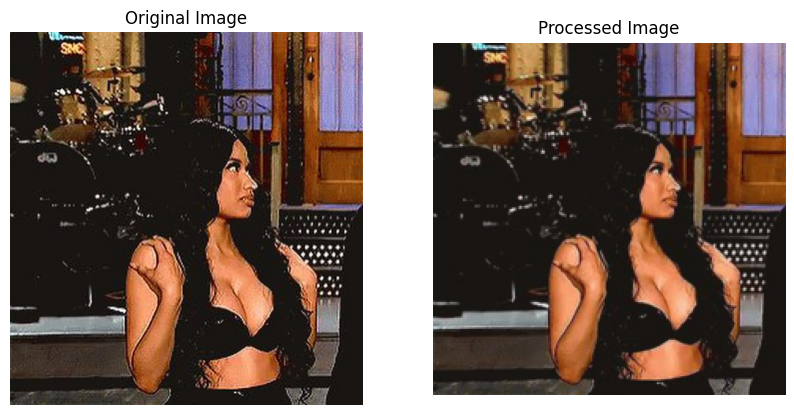

Ejemplo 5949:
Texto real:  @nicolasminajj well this thang so good make a nigga wanna sob https://t.co/BrH3zGTuaB
Texto generado:  re re re re re re re re re re re re



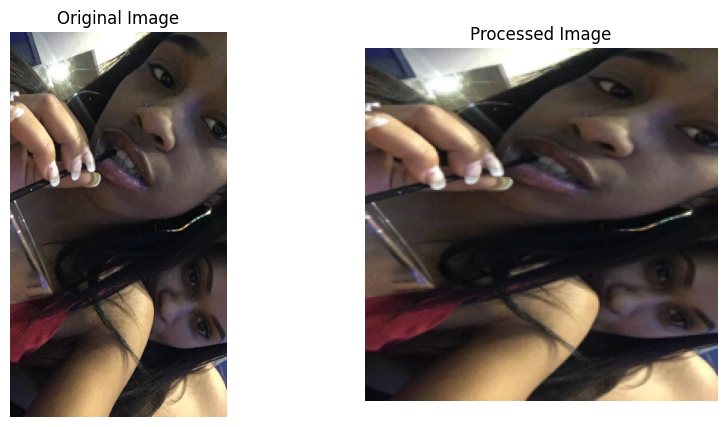

Ejemplo 5812:
Texto real:  We on our grind, like fuck a nigga we’ll get some dick later. https://t.co/3ROwescOi3
Texto generado:  



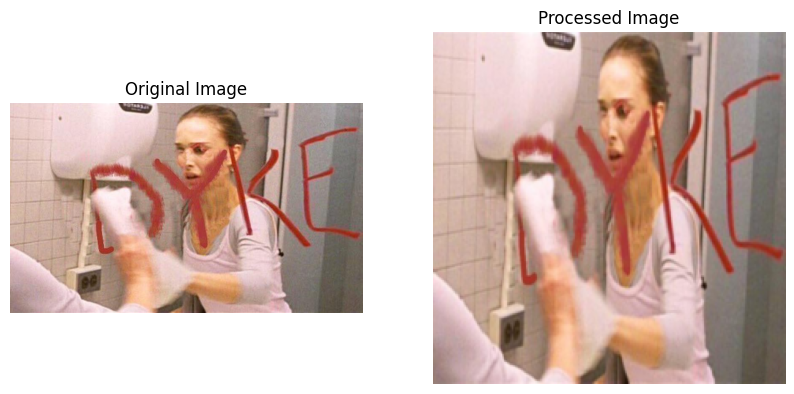

Ejemplo 2632:
Texto real:  @MomosPigtails KSKSKKS. NO B IM GOOD I APPRECIATE IT I JUST HAVE TO BE A DYKE IN SECRET https://t.co/LkAaao94mk
Texto generado:  Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re



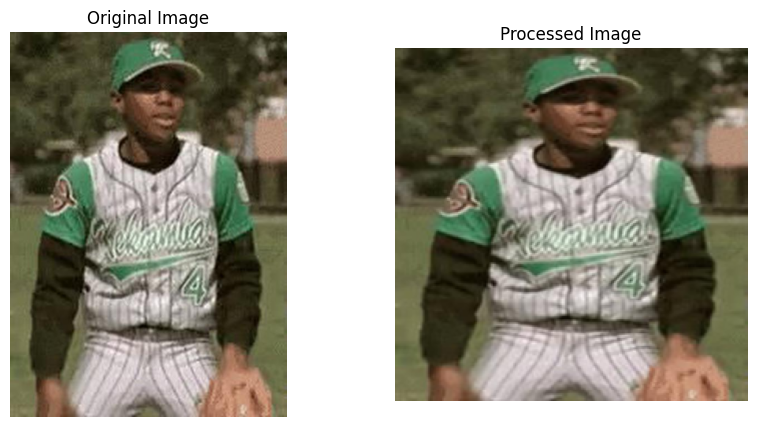

Ejemplo 8976:
Texto real:  I BET THIS NIGGA WHILE LISTENING TO HARDBALL 😂😂😭😭 https://t.co/K6YXJ2LR1E
Texto generado:  



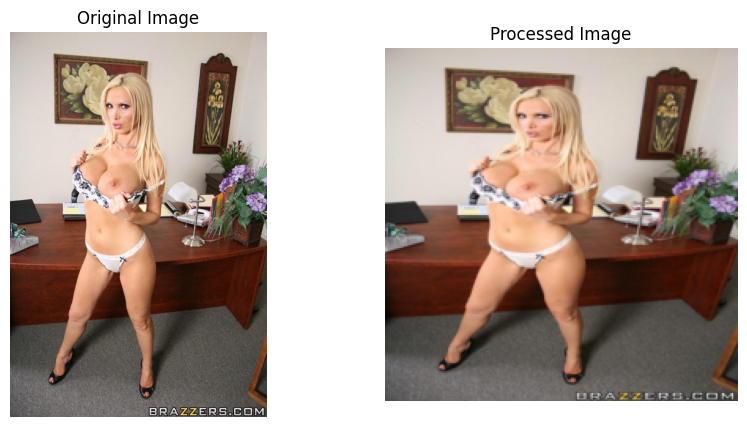

Ejemplo 8149:
Texto real:  Full Video: https://t.co/1olFOpEWV1 Office MILF Nikki Benz is stripping and fingering her tight cunt... https://t.co/VkZyvvvK3R
Texto generado:  c c c                                                                                                            Mo Mo Mo Mo Mo Mo Mo Mo Mo Mo Mo Mo Mo Mo



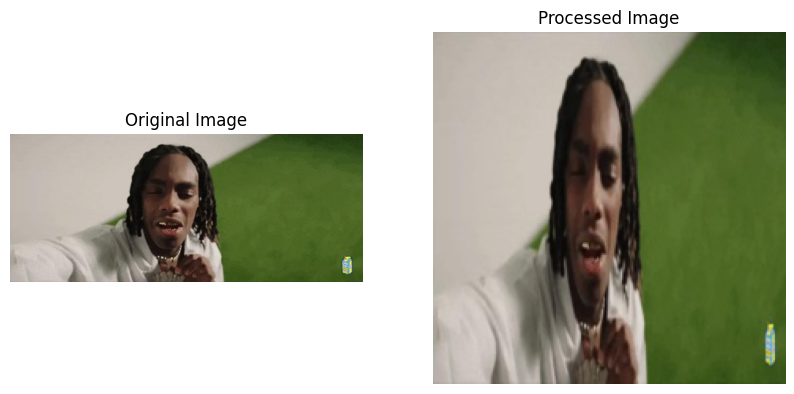

Ejemplo 2477:
Texto real:  ynw melly cute and all, but that nigga can’t be trusted. next 😂🤷🏽‍♀️ https://t.co/GmJnmcyn3v
Texto generado:  re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re re



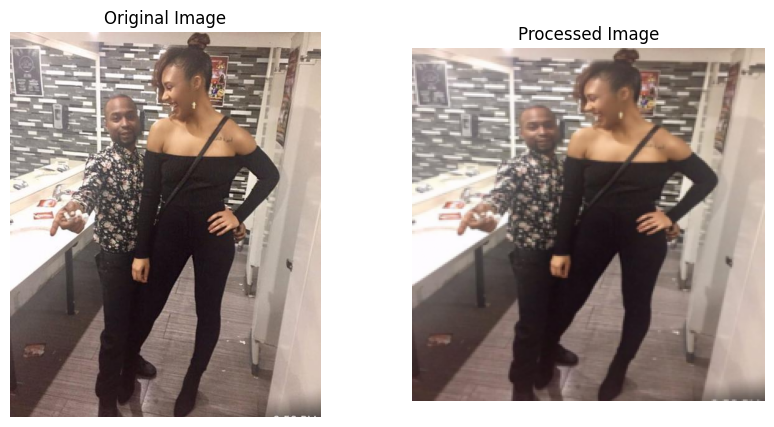

Ejemplo 6735:
Texto real:  @EmonieMonaee 5’8 ... but lil nigga got me feelin’ like a Goddess https://t.co/a7nfGCALGf
Texto generado:  



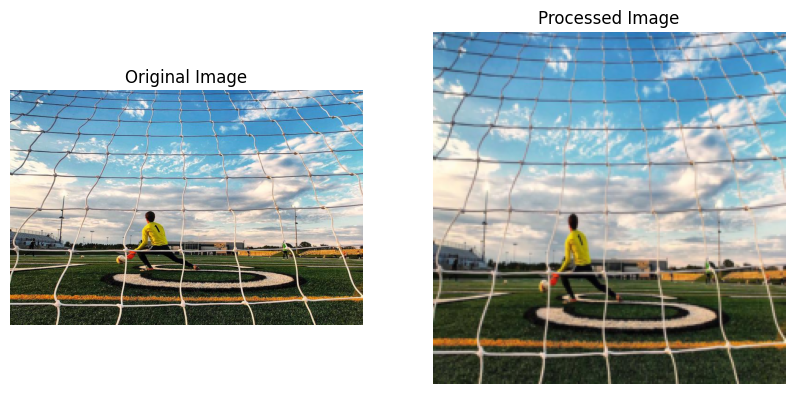

Ejemplo 5204:
Texto real:  Streaks host Moline on the Van Dyke Field pitch in WB6 action... https://t.co/uf8YzePDpo
Texto generado:  c f c f c c c                                                                                      non non non non non non non non non non non non non non



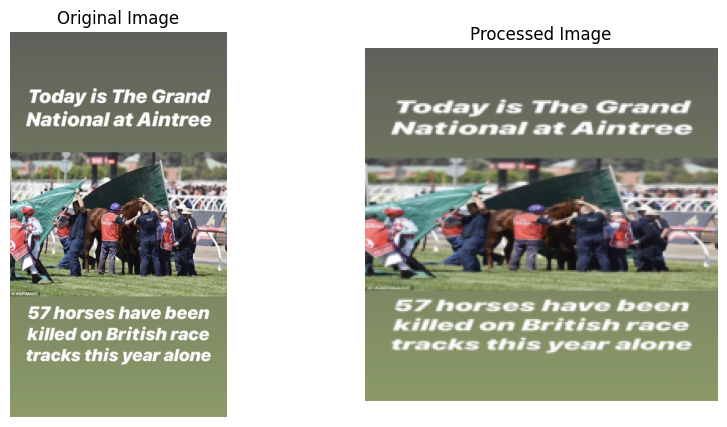

Ejemplo 3657:
Texto real:  Don’t be a cunt and support this cruelty. https://t.co/hNbpDbwmUQ
Texto generado:  



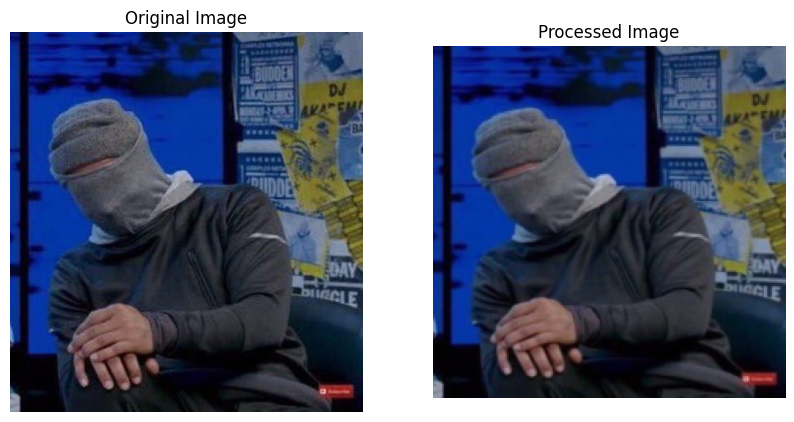

Ejemplo 7852:
Texto real:  “Oo this nigga jumped” https://t.co/b8317iGhdR
Texto generado:  



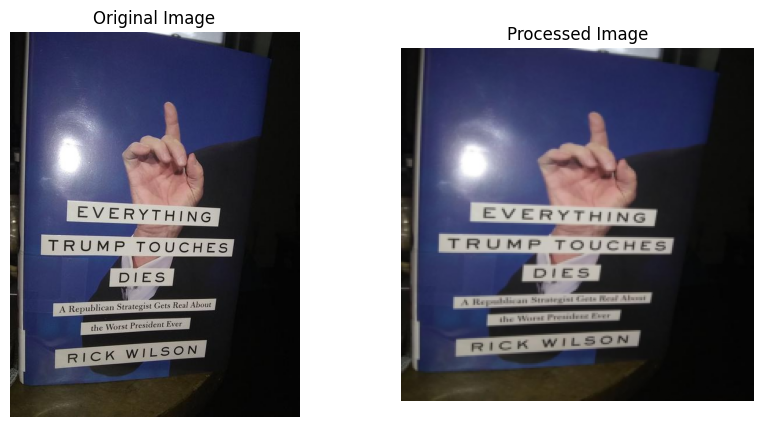

Ejemplo 1732:
Texto real:  Gonna fix a redneck margarita for reading time. https://t.co/roO4nU4LHw
Texto generado:  re re re re re re re re



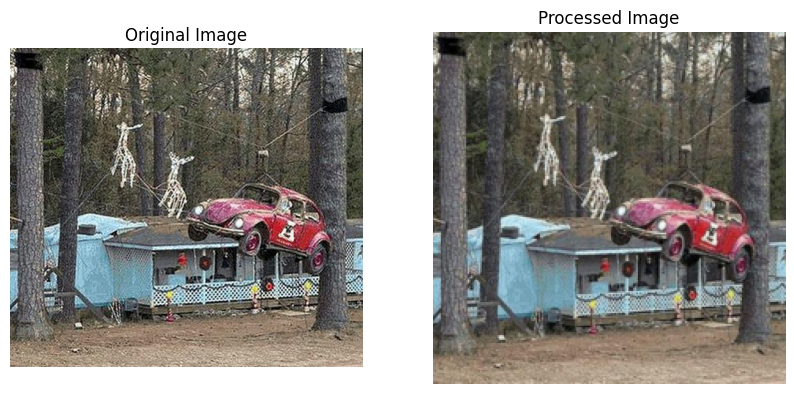

Ejemplo 9125:
Texto real:  @Yamiche @MSNBC Trump has turned the WH into trailer trash 🤦🏻‍♂️💩 https://t.co/n8KPi0asAe
Texto generado:  



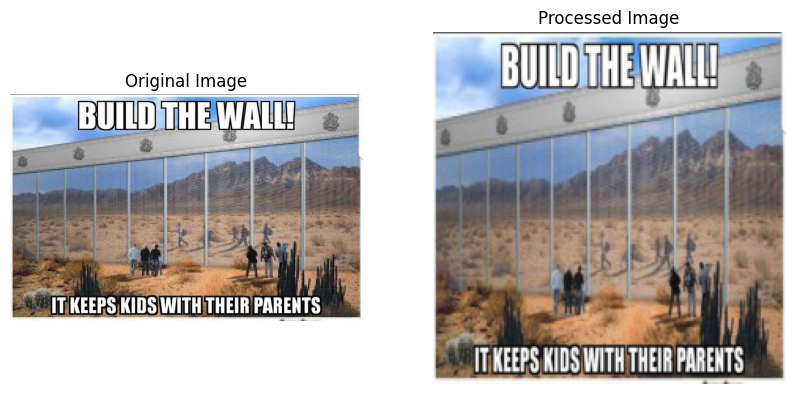

Ejemplo 8477:
Texto real:  @SenJeffMerkley @realDonaldTrump Secure our border and this wouldn’t be an issue Jeff. #BuildTheWall https://t.co/nxPs9IObPs
Texto generado:  mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad mad



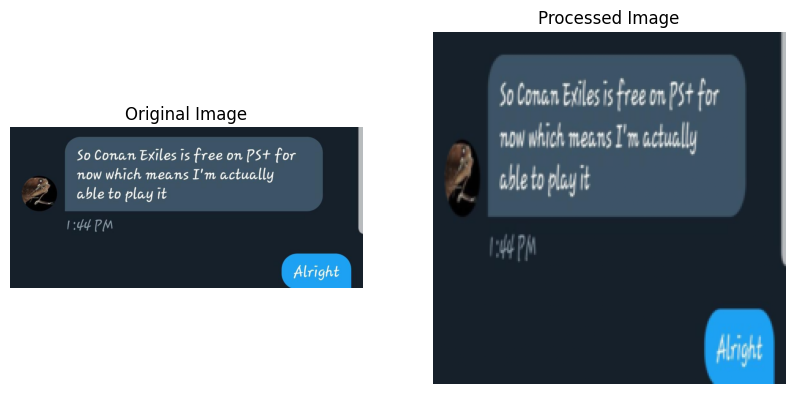

Ejemplo 6981:
Texto real:  somebody pray for my nigga @IAmNormalHuman https://t.co/hLo3Q4hCRE
Texto generado:  re re re re re re



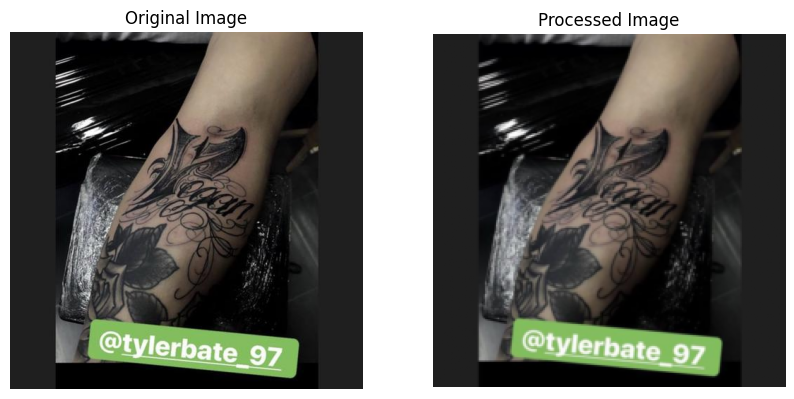

Ejemplo 5898:
Texto real:  @gailinterrupted Can’t trust a nigga that gets this kinda tattoo, Gail. https://t.co/UN8UVG9mRv
Texto generado:  Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re Re



In [ ]:
# Seleccionar la GPU 1 (que será la única visible y será indexada como 0)
torch.cuda.set_device(1)

import random
from transformers import T5Tokenizer
import torch
import json
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

# Función para cargar datos
def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    return data, id_test

# Función para mostrar las imágenes
def show_images(original_image, processed_image):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(processed_image.permute(1, 2, 0).cpu().numpy())
    axs[1].set_title("Processed Image")
    axs[1].axis('off')

    plt.show()

# Función para probar ejemplos del conjunto de prueba
def test_examples(lit_model, tokenizer, test_dataset, data, num_examples = 5):
    lit_model.eval()
    lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

    # Seleccionar N ejemplos aleatorios del conjunto de prueba
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        pixel_values = sample['pixel_values'].unsqueeze(0).to(lit_model.device)

        # Obtener el texto real del tweet
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        # Mostrar imagen original y procesada
        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')
        processed_image = sample['pixel_values']

        show_images(original_image, processed_image)

        # Generar texto a partir de la imagen
        with torch.no_grad():
            # Obtener representaciones visuales del modelo CLIP
            clip_outputs = lit_model.model.clip.vision_model(pixel_values=pixel_values)
            visual_features = lit_model.model.linear(clip_outputs.last_hidden_state)

            if visual_features.ndim == 2:
                visual_features = visual_features.unsqueeze(1) 
                
                        
            # Generar IDs de texto usando el decodificador T5 con las representaciones visuales como entradas
            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=clip_outputs,#(visual_features,), #ENCODER OUTPUTS, NO INPUT EMBEDS
                max_length=128,
                num_beams=4,
                early_stopping=True
            )

            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Comparar el texto generado con el texto real
        print(f"Ejemplo {i+1}:")
        print("Texto real: ", tweet_text)
        print("Texto generado: ", generated_text)
        print()

# Ruta base
base_path = "./"

# Cargar datos y tokenizer
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Usar el tokenizador de t5-base
img_dir = "./img_resized"

# Crear diccionario de datos para el conjunto de prueba
dict_test = {x: data[x] for x in id_test if x in data}
test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer)

# Cargar el modelo entrenado
model = VisionTextModel()
checkpoint_path = "checkpoints/model-epoch=04-val_loss=0.48.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

# Probar el modelo con 5 ejemplos
test_examples(lit_model, tokenizer, test_dataset, data, 15)


Se puede observar que, sin normalizar los valores RGB, los resultados son notablemente peores, así que mantendremos dicho proceso.

# 🔴 Repetición con CLIP LARGE 

In [21]:
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import os
import pickle
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from evaluate import load
import re
import matplotlib.pyplot as plt
from transformers.modeling_outputs import BaseModelOutput

# Definición del modelo que combina los embeddings precomputados y T5
class VisionTextModel(nn.Module):
    def __init__(self, input_dim=768, output_dim=768):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        # Cambiar la dimensión de input_dim (embedding precomputado) a output_dim (entrada de T5-base)
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Pasar los embeddings adaptados al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, tokenizer, embeddings, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.embeddings = embeddings  # Embeddings precomputados
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener el embedding precomputado correspondiente al tweet
        visual_features = torch.tensor(self.embeddings[tweet_id])

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": visual_features,
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings precomputados y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Tokenizador de T5
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.model.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Generar texto basado en los embeddings visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            decoder_start_token_id=self.tokenizer.pad_token_id
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplejidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplejidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.model.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Generar texto basado en los embeddings visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplejidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplejidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precomputados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, tokenizer, embeddings)
    val_dataset = MMHS150KDataset(dict_val, tokenizer, embeddings)
    test_dataset = MMHS150KDataset(dict_test, tokenizer, embeddings)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel(input_dim=768, output_dim=768)  # Asegurar las dimensiones correctas de los embeddings
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision='16-mixed',  # Precisión flotante de 16 bits para reducir el uso de memoria
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | VisionTextModel  | 223 M 
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
223 M     Trainable params
0         Non-trainable params
223 M     Total params
893.977   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: [USR] Fuck nigga you good 
Texto generado: nigga you good nigga you good nigga you good
Step 100:
Texto original: [USR] [USR] Ma nigga...😂😂😂 
Texto generado: [USR] [USR] [USR] [USR] [US
Step 200:
Texto original: The random nigga in the middle of the fight got me dead  
Texto generado: got me dead. got me dead. The random nigga in the middle
Step 300:
Texto original: [USR] LMAO what a fuckin retard. 
Texto generado: [USR] LMAO what a fuckin retard.
Step 400:
Texto original: i wonder if she knows she’s a dyke 
Texto generado: wonder if she knows she’s a dyke.
Step 500:
Texto original: [USR] Nigga..... 
Texto generado: [USR] Nigga.....
Step 600:
Texto original: [USR] Nigga get his bitch back every other week leave me alone god father! 
Texto generado: Nigga get his bitch back every other week leave me alone god father!
Step 700:
Texto original: [USR] nigga ? coragem 
Texto generado: nigga? coragem nigga? coragem
Step 800:
Texto original: Happy C-Day To The Only Nig

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Step 0:
Texto original: Today’s illegal immigration numbers thanks to [USR]  #BuildTheWall 
Texto generado: [USR] #BuildTheWall #BuildTheWall #BuildTheWall
Step 100:
Texto original: GAWKER: Rot in Hell  #GamerGate   [USR] 
Texto generado: [USR] Rot in Hell #GamerGate #GamerGate [US
Step 200:
Texto original: Bad ass bitch give a fuck about a nigga 🥵 
Texto generado: [USR] Nigga
Step 300:
Texto original: [USR] Nigga huh 
Texto generado: [USR] Nigga huh
Step 400:
Texto original: This nigga at work said he thinks he has Asian in his blood... because he likes plain. white. rice. 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 500:
Texto original: [USR] gimme my check nigga 
Texto generado: [USR] nigga gimme my check nigga
Step 600:
Texto original: When a nigga be tryna play his tunes but it just ain’t it 😭😭😭😂😂😂 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 700:
Texto original: It Could Be YOU! Just Follow, Fav + Retweet to win this Charming blart-clunking Psychopathic Bint Scheme (B

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: A nigga ever have you so wrapped around his finger that you apologize TO HIM when he fucks up? 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 100:
Texto original: [USR] This is not a safe space let’s fight nigga 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 200:
Texto original: Free my homie, Why you locking up a nigga with boxers on his head 😔 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 300:
Texto original: Conspiracy theorist Alex Jones loses court battle to stop Sandy Hook defamation suit  
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 400:
Texto original: [USR] Nigga said 
Texto generado: [USR] Nigga said he was a twat and
Step 500:
Texto original: My nigga bo came suited like it was his wedding 😂 past Sunday with the fam 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 600:
Texto original: Image of Aron taken before and after being called "Ginger cunt" 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 700:
Texto original: Sell the cun

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │   0.057865336537361145    │
│         test_loss         │    0.5000385046005249     │
│      test_perplexity      │    1.6510374546051025     │
└───────────────────────────┴───────────────────────────┘

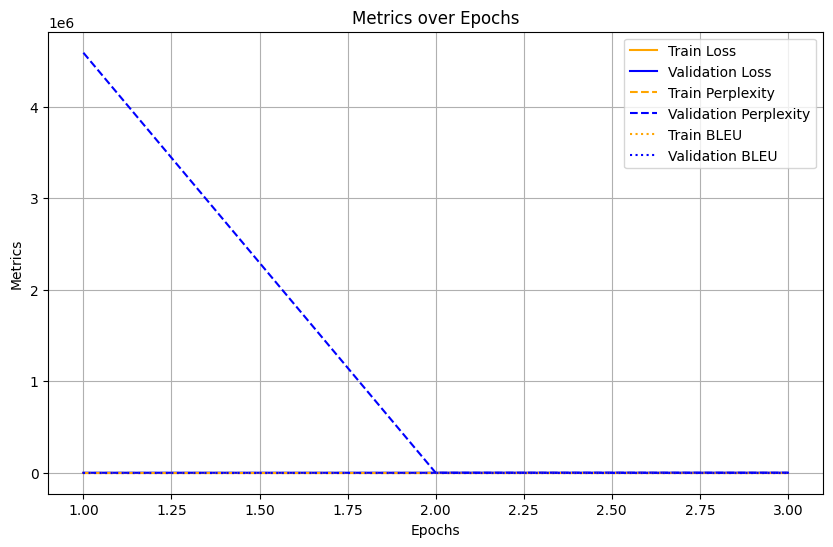

In [22]:
# Ejecutar el flujo principal
torch.cuda.set_device(1)  # Seleccionar GPU 1
main()

# 🔴Again

In [1]:
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import os
import pickle
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from evaluate import load
import re
import matplotlib.pyplot as plt
from transformers.modeling_outputs import BaseModelOutput

# Definición del modelo que combina los embeddings precomputados y T5
class VisionTextModel(nn.Module):
    def __init__(self, input_dim=768, output_dim=768):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        # Cambiar la dimensión de input_dim (embedding precomputado) a output_dim (entrada de T5-base)
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Pasar los embeddings adaptados al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, tokenizer, embeddings, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.embeddings = embeddings  # Embeddings precomputados
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener el embedding precomputado correspondiente al tweet
        visual_features = torch.tensor(self.embeddings[tweet_id])

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": visual_features,
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings precomputados y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Tokenizador de T5
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.model.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Generar texto basado en los embeddings visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            decoder_start_token_id=self.tokenizer.pad_token_id
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplejidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplejidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device)

        # Adaptar las dimensiones de los embeddings precomputados
        adapted_encoder_outputs = self.model.linear(visual_features)
        if adapted_encoder_outputs.ndim == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

        # Generar texto basado en los embeddings visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
            decoder_start_token_id=self.tokenizer.pad_token_id
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplejidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplejidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precomputados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, tokenizer, embeddings)
    val_dataset = MMHS150KDataset(dict_val, tokenizer, embeddings)
    test_dataset = MMHS150KDataset(dict_test, tokenizer, embeddings)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel(input_dim=768, output_dim=768)  # Asegurar las dimensiones correctas de los embeddings
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/',  # Directorio para guardar los checkpoints
        filename='model-large-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision='16-mixed',  # Precisión flotante de 16 bits para reducir el uso de memoria
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


2024-06-23 15:02:46.201388: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-23 15:02:46.273555: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-23 15:02:47.360832: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, y

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1201: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 32. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' doe

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Twat .. 
Texto generado: ..
Step 100:
Texto original: 16th is a big number for a stupid cunt like me 😚😚😚 
Texto generado: is a big number for a stupid cunt like me  16th
Step 200:
Texto original: WHEN WILL I GET MY BIG TALL DARKSINNED NIGGA??! 
Texto generado: WHEN WILL I GET MY BIG TALL DARKSINNED N
Step 300:
Texto original: i’m hot dawg catch up to me nigga ❣️ 
Texto generado: ’m hot dawg catch up to me nigga
Step 400:
Texto original: [USR] I hope that’s not how you saved that nigga with you 
Texto generado: [USR] I hope that’s not how you saved that nigga
Step 500:
Texto original: [USR] [USR] And I’m giving this nigga TKO 🔥🔥 
Texto generado: [USR] [USR] [USR] [USR] [US
Step 600:
Texto original: Am I a true born #sissy #faggot? Please RT for more if you like 💄💋😘 
Texto generado: #sissyfaggot? Am I a true born #
Step 700:
Texto original: [USR] [USR] This retarded pic again? 
Texto generado: [USR] [USR] [USR] [USR] [US
Step 800:
Texto original: Retarded jr, and 

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Step 0:
Texto original: “I’m not a peado, but if I was you’d be safe, you fat tubby ginger cunt” 😂😂 
Texto generado: [USR] “I’m not a peado, but if
Step 100:
Texto original: [USR] [USR] Nigga look like Rich Homie Juan. 
Texto generado: [USR] Nigga look like Rich Homie Juan.
Step 200:
Texto original: Nigga slandering at an all time high so early 
Texto generado: Nigga slandering at an all time high so early in the game
Step 300:
Texto original: this nigga thug said he used to wish to fuck his auntie .. 
Texto generado: [USR] Nigga thug said he used to wish to
Step 400:
Texto original: Panera workers going less than 2 minutes without saying faggot: 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 500:
Texto original: Some days I’m a Tigger Nigger but somedays I’m a Eyore Whore 
Texto generado: [USR] Some days I’m a Tigger Nigger but somedays
Step 600:
Texto original: Get a load of this nigga 
Texto generado: [USR] Nigga
Step 700:
Texto original: Young Trap Nigga w/ a Whole Lotta Sauce‼

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Baddest nigga you ever met😝😈 
Texto generado: Baddest nigga you ever met
Step 100:
Texto original: King Princess really released a song called Pussy is God... big dyke energy 
Texto generado: [USR] nigga i'm a dyke
Step 200:
Texto original: Me..... featuring the retarded dog filter. 🐶😂🤫 #justonce #OKAY 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 300:
Texto original: Mood: Pull up to yo hood and hire me a nigga🤣🤣 But nah fr we looking for more host/shooters📹📹 [USR] 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 400:
Texto original: R U Ready? Just Follow, Fav and Retweet &amp; you can win a Colin Fry bint-fumbling Belgian Elf Stitcher #WIN 
Texto generado: [USR] [USR] [USR] [USR] [USR
Step 500:
Texto original: Cunt of the day 
Texto generado: [USR] Cunt of the day - Cunt of the day
Step 600:
Texto original: I got hill lads dw ! Oh nvm a retard slid in   
Texto generado: [USR]
Step 700:
Texto original: Nigga called E a house nigga and E said “Well I do 

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=3` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │    0.05709041655063629    │
│         test_loss         │    0.5000882744789124     │
│      test_perplexity      │     1.651126503944397     │
└───────────────────────────┴───────────────────────────┘

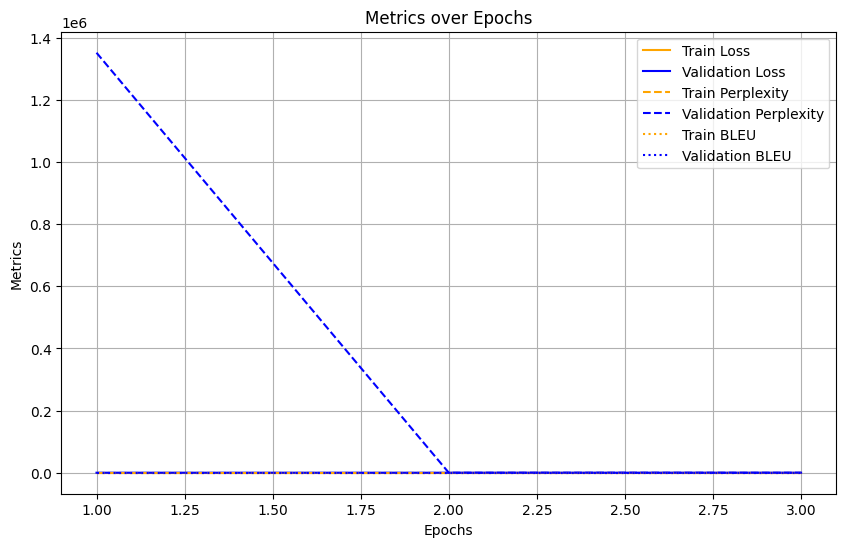

In [2]:
# Ejecutar el flujo principal
torch.cuda.set_device(1)  # Seleccionar GPU 1
main()

## Test

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


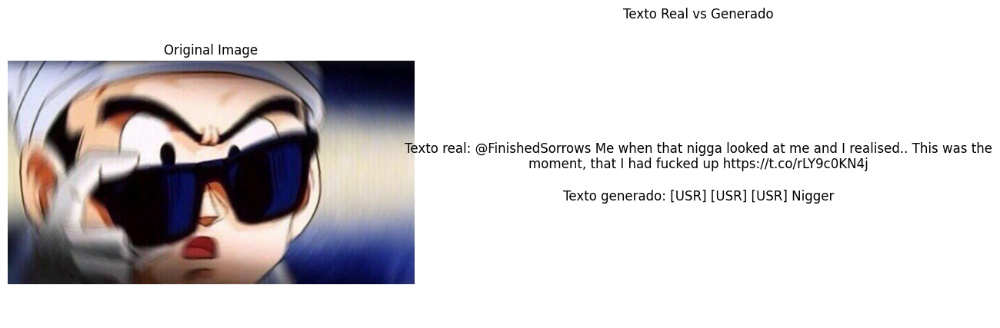

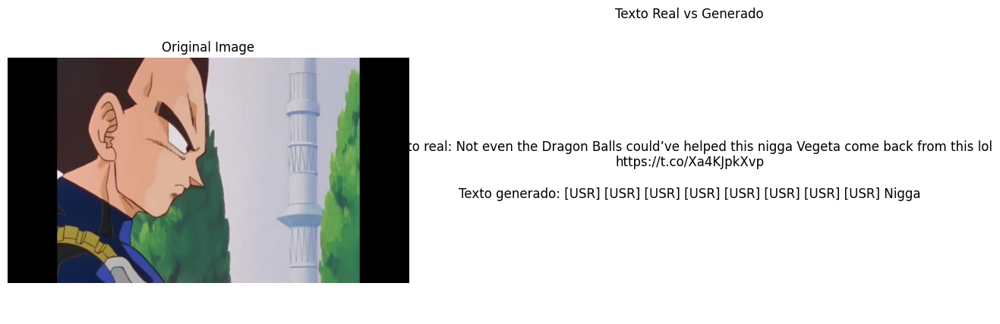

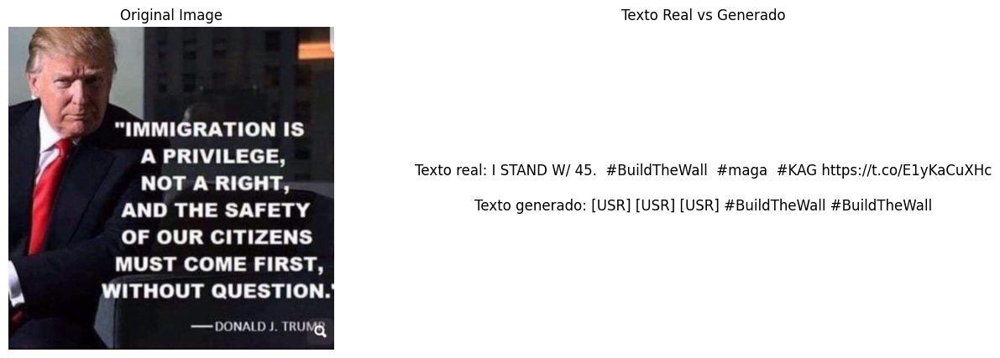

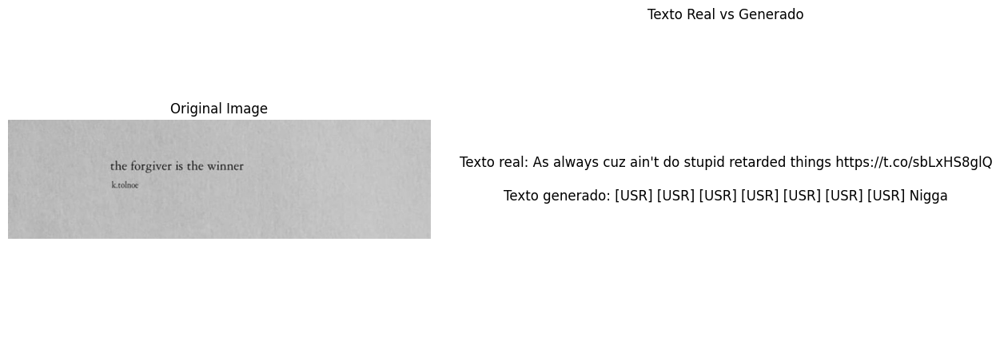

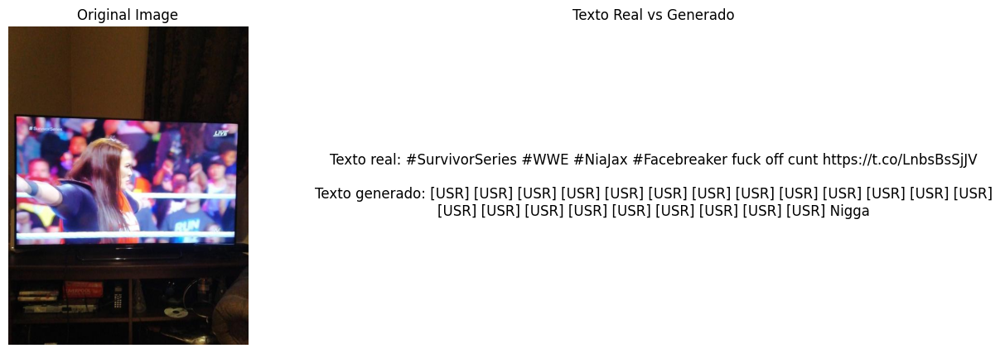

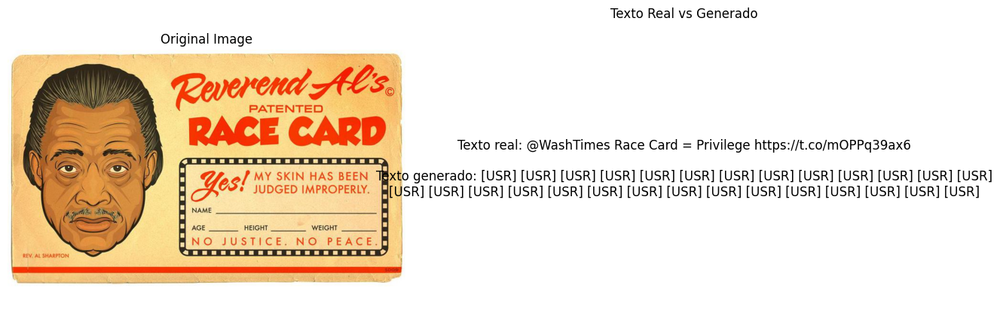

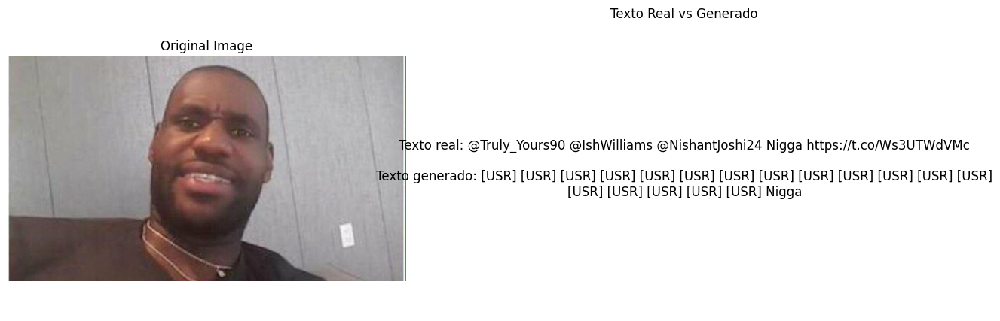

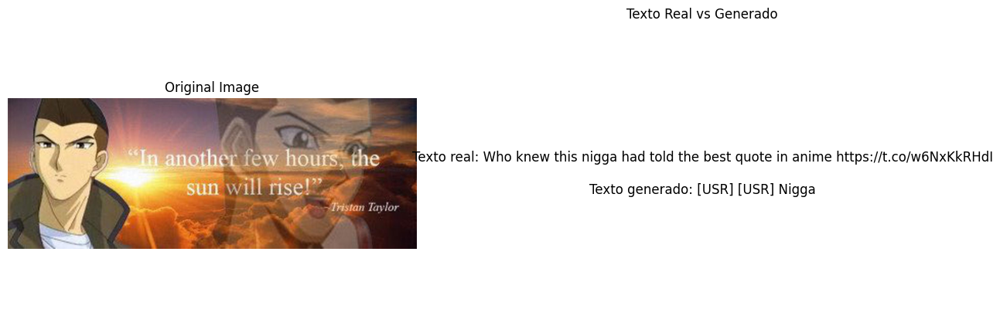

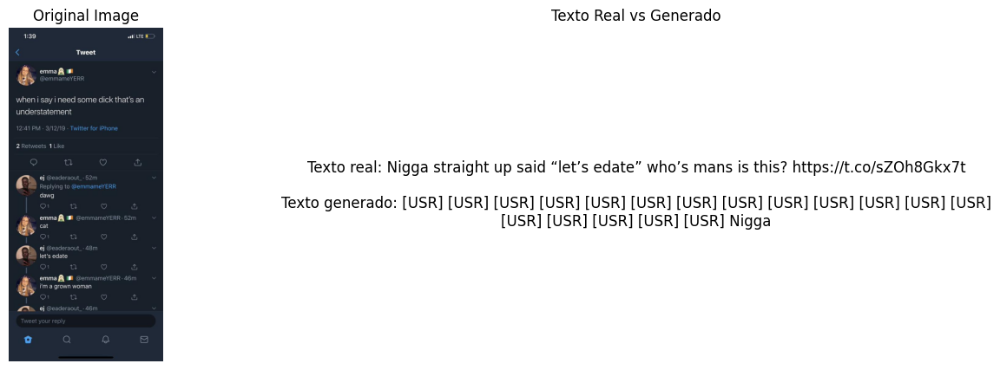

/home/javiermo/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10024 (\N{SPARKLES}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


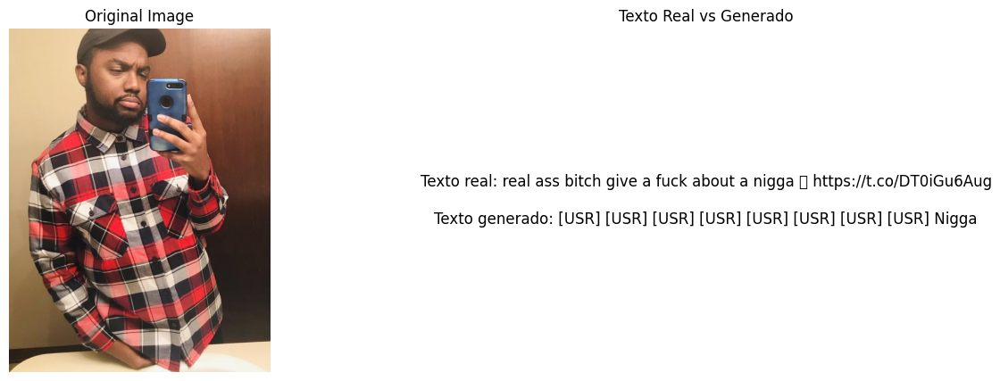

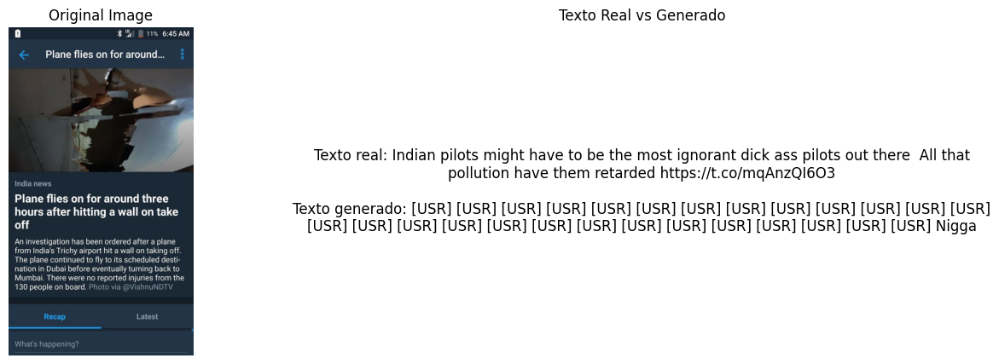

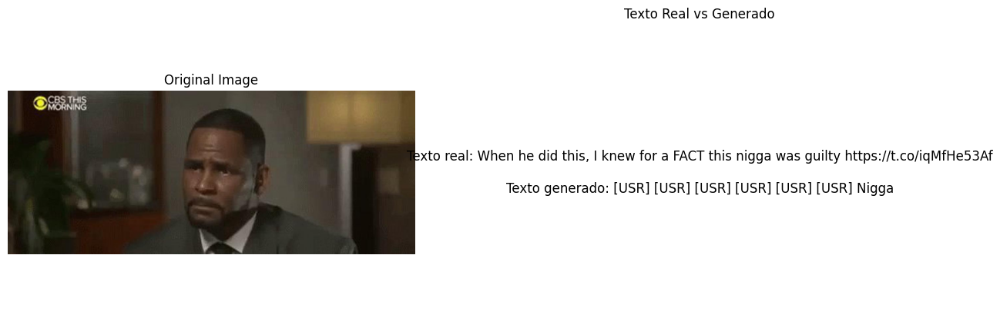

/home/javiermo/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 129396 (\N{FACE WITH UNEVEN EYES AND WAVY MOUTH}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


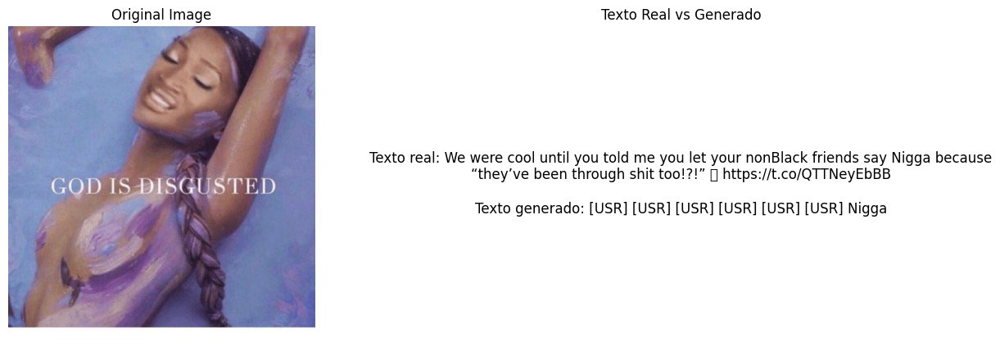

/home/javiermo/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128405 (\N{REVERSED HAND WITH MIDDLE FINGER EXTENDED}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/javiermo/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 127996 (\N{EMOJI MODIFIER FITZPATRICK TYPE-3}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


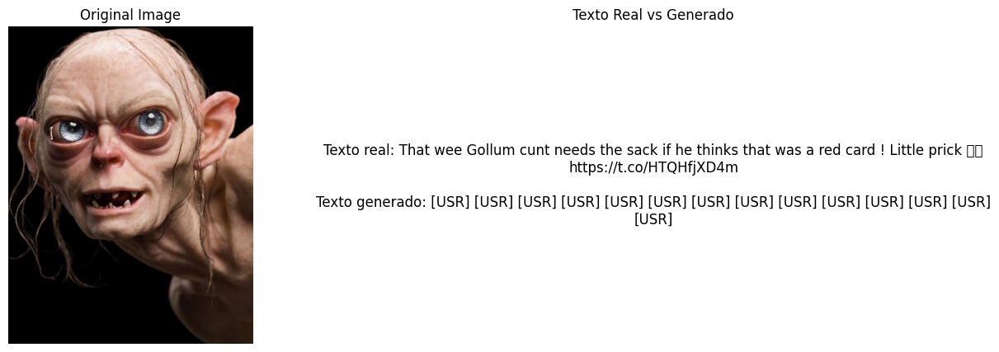

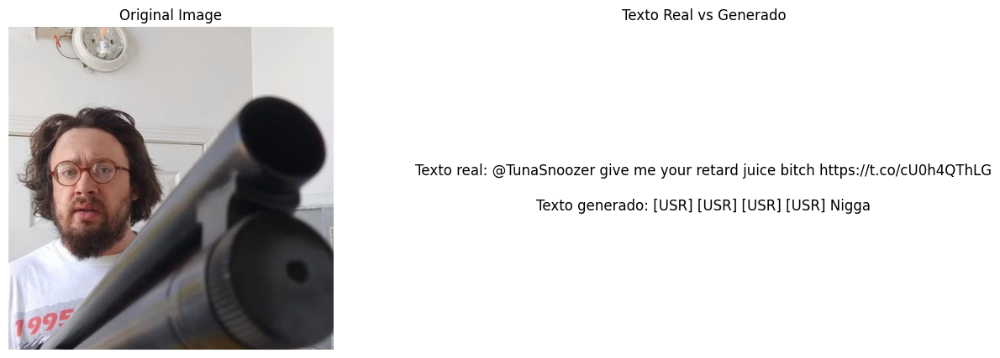

In [8]:
import random
from transformers import T5Tokenizer
import torch
import json
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

# Función para cargar datos
def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    return data, id_test

# Función para mostrar las imágenes y textos
def show_images_and_text(original_image, tweet_text, generated_text):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].text(0.5, 0.5, f"Texto real: {tweet_text}\n\nTexto generado: {generated_text}", 
                ha='center', va='center', wrap=True, fontsize=12)
    axs[1].set_title("Texto Real vs Generado")
    axs[1].axis('off')

    plt.show()

# Función para probar ejemplos del conjunto de prueba
def test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5):
    lit_model.eval()
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    lit_model.to(device)

    # Seleccionar N ejemplos aleatorios del conjunto de prueba
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        visual_features = sample['visual_features'].unsqueeze(0).to(device)

        # Obtener el texto real del tweet
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        # Mostrar imagen original
        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')

        # Generar texto a partir de los embeddings
        with torch.no_grad():
            adapted_encoder_outputs = lit_model.model.linear(visual_features)
            if adapted_encoder_outputs.ndim == 2:
                adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)

            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=BaseModelOutput(last_hidden_state=adapted_encoder_outputs),
                max_length=128,
                num_beams=4,
                early_stopping=True
            )

            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Mostrar imagen y textos
        show_images_and_text(original_image, tweet_text, generated_text)

# Ruta base
base_path = "./"

# Cargar datos y tokenizer
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base')  # Usar el tokenizador de t5-base
img_dir = "./img_resized"

# Crear diccionario de datos para el conjunto de prueba
dict_test = {x: data[x] for x in id_test if x in data}
# Cargar los embeddings precomputados
with open('image_embeddings.pkl', 'rb') as f:
    embeddings = pickle.load(f)

# Crear el dataset de test
test_dataset = MMHS150KDataset(dict_test, tokenizer, embeddings)

# Cargar el modelo entrenado
model = VisionTextModel(input_dim=768, output_dim=768)
checkpoint_path = "checkpoints/model-large-epoch=02-val_loss=0.50.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

# Probar el modelo con 15 ejemplos
test_examples(lit_model, tokenizer, test_dataset, data, num_examples=15)


Se puede apreciar que el modelo ha sobre-aprendido a generar secuencias de token "USR"

# 🔴Yet another clip large

In [1]:
# Importar modelos y tokenizadores de transformers
from transformers import CLIPModel, CLIPTokenizer
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from torch.utils.data import Dataset, DataLoader
import json
import os
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from evaluate import load
import re
import matplotlib.pyplot as plt
import bitsandbytes as bnb

# Definición del modelo que combina CLIP y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo CLIP Large preentrenado
        self.clip = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
        
        # Cuantizar la capa Linear usando bitsandbytes
        self.linear = bnb.nn.Linear4bit(1024, 768)
        
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Obtener características de la imagen usando CLIP
        clip_outputs = self.clip.vision_model(pixel_values=pixel_values)
        visual_features = self.linear(clip_outputs.last_hidden_state)
        
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, img_dir, tokenizer, max_length=512):  # Ajustar max_length a 512
        self.data_dict = data_dict  # Diccionario con los datos
        self.img_dir = img_dir  # Directorio donde se encuentran las imágenes
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos
        # Transformaciones para preprocesar las imágenes
        self.transforms = Compose([
            Resize((224, 224)),  # Redimensionar a 224x224
            ToTensor(),  # Convertir a tensor
            Normalize(mean=[0.48145466, 0.4578275, 0.40821073], std=[0.26862954, 0.26130258, 0.27577711])  # Normalizar con la media y desviación estándar de CLIP
        ])

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        # Construir la ruta de la imagen correspondiente al tweet
        img_filename = tweet_id + ".jpg"
        img_path = os.path.join(self.img_dir, img_filename)
        # Cargar la imagen y aplicarle las transformaciones
        image = Image.open(img_path).convert('RGB')
        image = self.transforms(image)

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "pixel_values": image,
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina CLIP y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)  # Ajustar model_max_length a 512
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(pixel_values=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device).half()
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=512)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device).half()
        labels = batch['labels'].to(self.device).long()

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        visual_features = self.model.linear(clip_outputs.last_hidden_state)

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=encoder_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        pixel_values = batch['pixel_values'].to(self.device).half()
        labels = batch['labels'].to(self.device).long()

        # Obtener embeddings visuales usando CLIP
        clip_outputs = self.model.clip.vision_model(pixel_values=pixel_values)
        visual_features = self.model.linear(clip_outputs.last_hidden_state)

        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)

        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=encoder_outputs,
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=512)  # Usar el comportamiento nuevo del tokenizador
    img_dir = "./img_resized"

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, img_dir, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, img_dir, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    torch.cuda.set_device(1)
    main()


[2024-06-29 14:45:00,719] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


2024-06-29 14:45:01.429519: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-29 14:45:01.475279: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-29 14:45:02.135426: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download,

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 192.00 MiB. GPU 0 has a total capacty of 23.69 GiB of which 52.94 MiB is free. Process 816431 has 256.00 MiB memory in use. Process 829402 has 3.53 GiB memory in use. Including non-PyTorch memory, this process has 19.83 GiB memory in use. Of the allocated memory 19.05 GiB is allocated by PyTorch, and 477.50 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

### Código sin teacher forcing

In [1]:
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import os
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load  # Asegurarse de que `evaluate` esté instalado
from pytorch_lightning.callbacks import ModelCheckpoint  # Añadir esta importación
from pytorch_lightning import Trainer

# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):  # Ajustar max_length a 512
        self.data_dict = data_dict  # Diccionario con los datos
        self.embeddings_dict = embeddings_dict  # Diccionario con los embeddings
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener los embeddings precalculados
        visual_features = self.embeddings_dict[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)  # Ajustar model_max_length a 512
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=512)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precalculados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=512)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    torch.cuda.set_device(1)
    main()


[2024-06-29 15:37:24,672] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


2024-06-29 15:37:25.152139: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-29 15:37:25.194712: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-29 15:37:25.838495: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download,

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: I just had a nigga tell me she is not bad hello??? 
Texto generado: i just had a nigga tell me she is not bad?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????


/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

### Ahora con el teacher forcing

-> Resultado: Sobreajusta a decir "USR USR USR..."

In [1]:
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import os
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load  # Asegurarse de que `evaluate` esté instalado
from pytorch_lightning.callbacks import ModelCheckpoint  # Añadir esta importación
from pytorch_lightning import Trainer

# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):  # Ajustar max_length a 512
        self.data_dict = data_dict  # Diccionario con los datos
        self.embeddings_dict = embeddings_dict  # Diccionario con los embeddings
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener los embeddings precalculados
        visual_features = self.embeddings_dict[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)  # Ajustar model_max_length a 512
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=512)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precalculados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=512)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=3,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=3,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    torch.cuda.set_device(1)
    main()


Parece que a partir de unas cuántas iteraciones, cae en generar "[USR][USR][USR]..." 
Al cabo de más, genera siempre textos vacíos. 

Ideas:

- Regularización para evitar sobreajuste
- Función de pérdida modificada para penalizar repetición

[2024-06-29 20:28:20,033] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


2024-06-29 20:28:20.859687: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-29 20:28:20.931488: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-29 20:28:21.796656: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download,

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: [USR] [USR] Nigga said 
Texto generado: [USR] [USR] [USR] [USR] Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said Nigga said
Step 100:
Texto original: Porn all over my TL, nigga. Why y’all don’t use the bookmark feature? 
Texto generado: ...... y’all don’t use the bookmark feature??..??. nigga.... nigga.. the bookmark feature?..?..?....?  the bookmarks?  the bookmarks?.. y’all don’t use the bookmark feature?
Step 200:
Texto original: How can I take trips with you if you keep asking for a nigga to buy you hair 
Texto generado: a nigga?? a nigga?????? a nigga????? a nigga??? a nigga to buy you hair?? if you keep asking for a nigga to buy you hair????????? I can take trips with you?
Step 300:
Texto original: rob a nigga shoes, rob a nigga lace 
Texto generado: a nig

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
`Trainer.fit` stopped: `max_epochs=1` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │   0.0020203585736453533   │
│         test_loss         │            nan            │
│      test_perplexity      │            nan            │
└───────────────────────────┴───────────────────────────┘

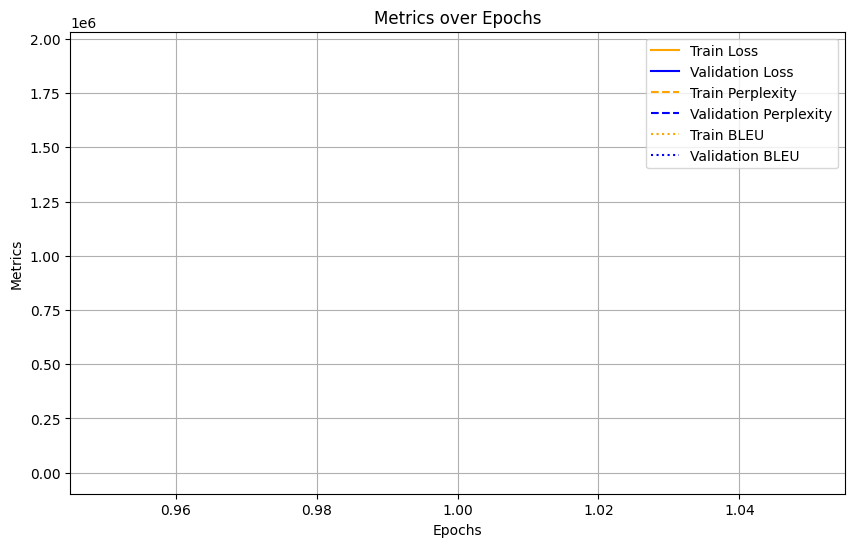

In [1]:
import os 
# Especificar las GPU 1 y 2 para ser visibles por PyTorch
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2"  
 
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load  # Asegurarse de que `evaluate` esté instalado
from pytorch_lightning.callbacks import ModelCheckpoint  # Añadir esta importación
from pytorch_lightning import Trainer
 
 
# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        self.dropout = nn.Dropout(0.1)  # Añadir Dropout para regularización

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):  # Ajustar max_length a 512
        self.data_dict = data_dict  # Diccionario con los datos
        self.embeddings_dict = embeddings_dict  # Diccionario con los embeddings
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener los embeddings precalculados
        visual_features = self.embeddings_dict[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)  # Ajustar model_max_length a 512
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=512)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precalculados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=512)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=1,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=1,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    #torch.cuda.set_device(1)
    main()


test

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


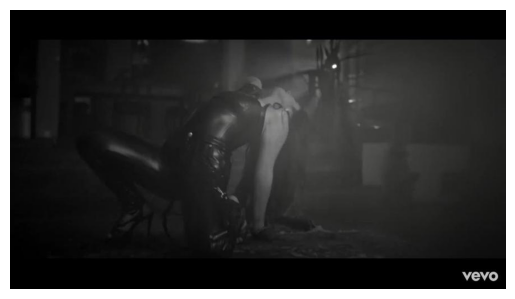

Ejemplo 1098:
Texto real:  thank you to lauren jauregui for reminding me what a huge fucking dyke i am https://t.co/Q7kv3iz1RC
Texto generado:  [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] Nigga



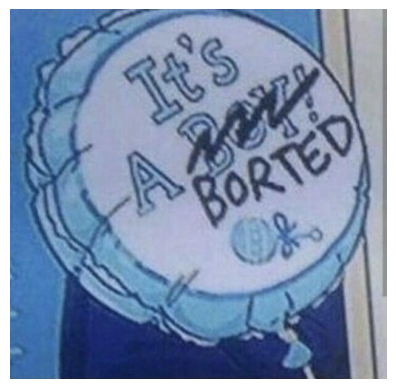

Ejemplo 3548:
Texto real:  @ddyrbby This nigga gay asf https://t.co/2X5EZlizcA
Texto generado:  [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] Nigga



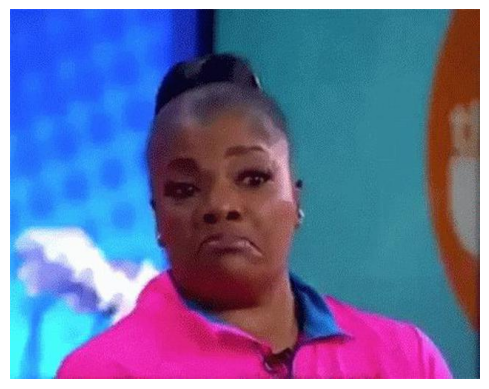

Ejemplo 6942:
Texto real:  Damn I had the perfect chance to hit a nigga with the Monique and I forgot 😭😭 I’m disappointed https://t.co/wr3DgCGd3V
Texto generado:  [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR] [USR



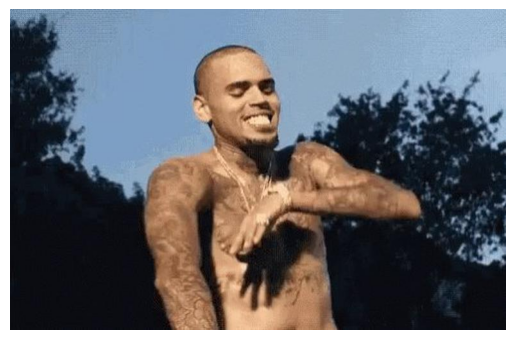

Ejemplo 2411:
Texto real:  U know.... I’ve said this before, but Ima say it again...  Christopher Maurice? THAT NIGGA SINGS THE THINGS!!!!!! https://t.co/TTzTLuB9MG
Texto generado:  [USR] [USR] [USR] [USR] nigga



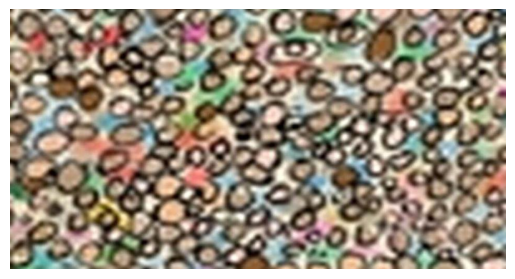

Ejemplo 1080:
Texto real:  The Migrant 'Invasion' Summed Up By One Cartoon https://t.co/GSpZoD0g29 #AmericaFirst #BuildTheWall #MAGA https://t.co/baTOPHp4NV
Texto generado:  [USR] [USR] [USR] [USR] [USR] Nigga



In [6]:
import os
import random
import json
from transformers import T5Tokenizer
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from transformers.modeling_outputs import BaseModelOutput

# Definición del dataset (usando embeddings precalculados)
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):
        self.data_dict = data_dict
        self.embeddings_dict = embeddings_dict
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data_dict)

    def __getitem__(self, idx):
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        visual_features = self.embeddings_dict[tweet_id]
        tweet_text = tweet_info['tweet_text']

        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,
            "inputs": inputs.input_ids.squeeze(0)
        }

def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '[USR]', text)
    return text

def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()
    return data, id_test

def show_image(image):
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5):
    lit_model.eval()
    lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        visual_features = sample['visual_features'].unsqueeze(0).to(lit_model.device)
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')

        show_image(original_image)

        with torch.no_grad():
            # Nos aseguramos de que visual_features tenga las dimensiones correctas
            if visual_features.ndimension() == 2:
                visual_features = visual_features.unsqueeze(0)
            
            encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)
            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=encoder_outputs,
                max_length=128,
                num_beams=4,
                early_stopping=True
            )
            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        print(f"Ejemplo {i+1}:")
        print("Texto real: ", tweet_text)
        print("Texto generado: ", generated_text)
        print()

base_path = "./"
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)

with open('image_embeddings.pkl', 'rb') as f:
    embeddings_dict = pickle.load(f)

dict_test = {x: data[x] for x in id_test if x in data}
test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

model = VisionTextModel()
checkpoint_path = "checkpoints/clip-large/model-epoch=00-val_loss=0.16.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5)


### Probemos eliminando usuarios

-> Resultado: Aprende a decir "nigga nigga nigga" en bucle.

/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/home/javiermo/.local/lib/python3.10/site-packages/lightning_fabric/connector.py:563: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Twat reboot 
Texto generado: .twat reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot reboot
Step 100:
Texto original: It said “Twat Waffle!” 🤣🤣🤣🤣 I have it set to an Irish accent. BEST in app purchase ever! 
Texto generado: It said “Twat Waffle!” I had to order it. It said “Twat Waff

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │            0.0            │
│         test_loss         │            nan            │
│      test_perplexity      │            nan            │
└───────────────────────────┴───────────────────────────┘

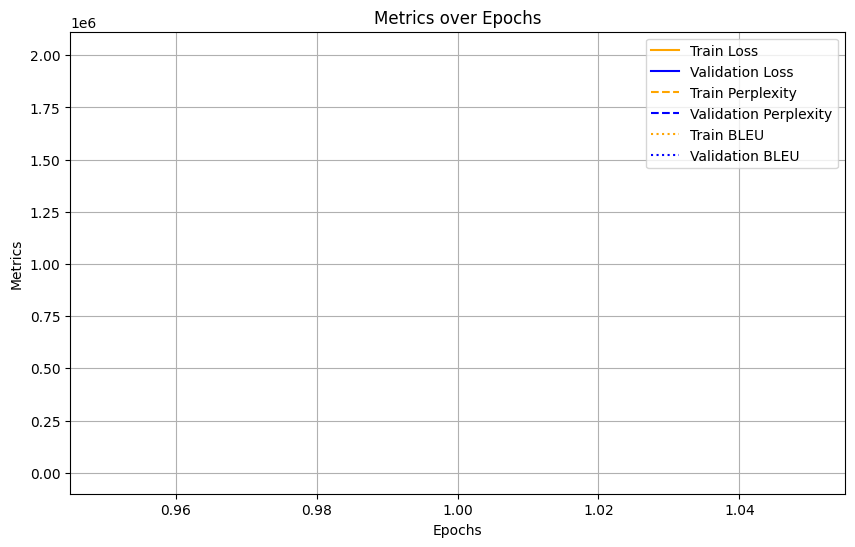

In [7]:
import os 
# Especificar las GPU 1 y 2 para ser visibles por PyTorch
#os.environ["CUDA_VISIBLE_DEVICES"] = "1,2"  
 
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load  # Asegurarse de que `evaluate` esté instalado
from pytorch_lightning.callbacks import ModelCheckpoint  # Añadir esta importación
from pytorch_lightning import Trainer
 
 
# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        self.dropout = nn.Dropout(0.1)  # Añadir Dropout para regularización

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Eliminar menciones 
    text = re.sub(r'@\w+', '', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):  # Ajustar max_length a 512
        self.data_dict = data_dict  # Diccionario con los datos
        self.embeddings_dict = embeddings_dict  # Diccionario con los embeddings
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener los embeddings precalculados
        visual_features = self.embeddings_dict[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)  # Ajustar model_max_length a 512
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=512)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=512
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precalculados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=512)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename='model-{epoch:02d}-{val_loss:.2f}',  # Formato del nombre de archivo
        save_top_k=1,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=1,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    #torch.cuda.set_device(1)
    main()


/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


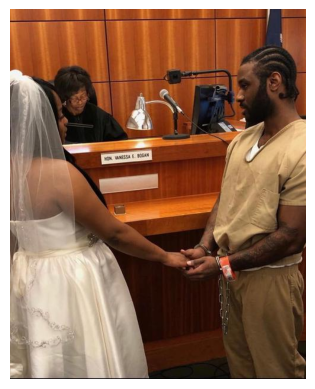

Ejemplo 5176:
Texto real:  Y’all let a nigga jail talk y’all into doing anything 🤦🏾‍♀️ https://t.co/Ys2fGDI3Gf
Texto generado:  Nigga



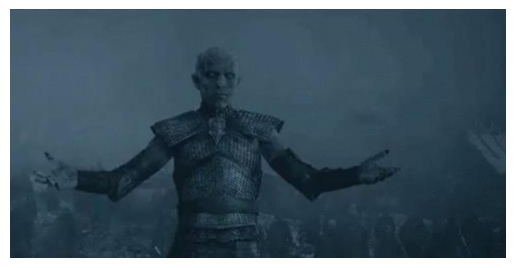

Ejemplo 3619:
Texto real:  This nigga about to take over https://t.co/z7NTCXJRMr
Texto generado:  My nigga



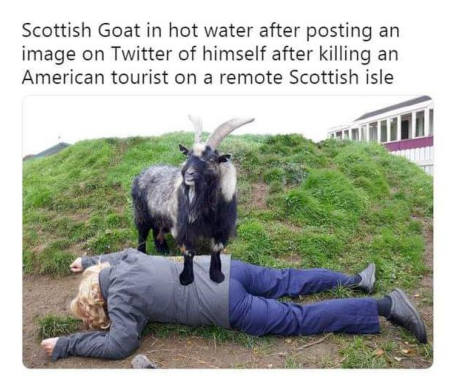

Ejemplo 3805:
Texto real:  Payback for the Yanky hunter cunt https://t.co/DQV9IIiYLo
Texto generado:  This nigga ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain



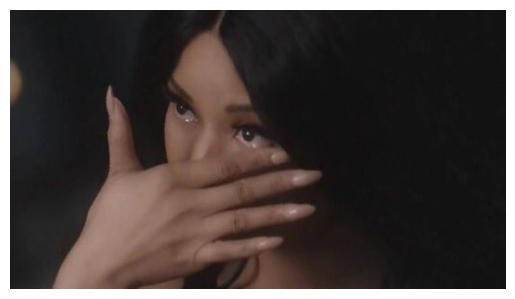

Ejemplo 313:
Texto real:  My best friend really gave me $25 for my Uber trips.  🗣 I LOVE DAT NIGGA! https://t.co/jYZcHnPXUv
Texto generado:  nigga



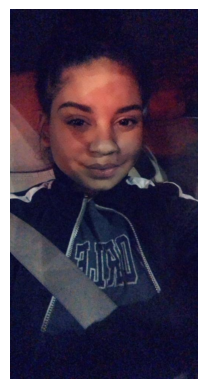

Ejemplo 2054:
Texto real:  "On my way to fuck another nigga bitccchhh" 🌚 https://t.co/SEFqfK00Fy
Texto generado:  I’m a nigga



: 

In [4]:
import os
import random
import json
from transformers import T5Tokenizer
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from transformers.modeling_outputs import BaseModelOutput
import pickle

# Definición del dataset (usando embeddings precalculados)
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):
        self.data_dict = data_dict
        self.embeddings_dict = embeddings_dict
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data_dict)

    def __getitem__(self, idx):
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        visual_features = self.embeddings_dict[tweet_id]
        tweet_text = tweet_info['tweet_text']

        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,
            "inputs": inputs.input_ids.squeeze(0)
        }

def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()
    return data, id_test

def show_image(image):
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5):
    lit_model.eval()
    lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        visual_features = sample['visual_features'].unsqueeze(0).to(lit_model.device)
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')

        show_image(original_image)

        with torch.no_grad():
            # Nos aseguramos de que visual_features tenga las dimensiones correctas
            if visual_features.ndimension() == 2:
                visual_features = visual_features.unsqueeze(0)
            
            encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)
            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=encoder_outputs,
                max_length=128,
                num_beams=4,
                early_stopping=True
            )
            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        print(f"Ejemplo {i+1}:")
        print("Texto real: ", tweet_text)
        print("Texto generado: ", generated_text)
        print()

base_path = "./"
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)

with open('image_embeddings.pkl', 'rb') as f:
    embeddings_dict = pickle.load(f)

dict_test = {x: data[x] for x in id_test if x in data}
test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

model = VisionTextModel()
checkpoint_path = "checkpoints/clip-large/model-epoch=00-val_loss=nan-v1.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5)


Se puede apreciar que ahora, tras quitar menciones, probablemente porque a menudo ve dicha palabra, ha aprendido a decir todo del rato "nigga"

### Ajuste de hiperparámetros

- num beams
- no_repeat_ngram_size
- label_smoothing al loss
- model length menor (sobra)
- top_p (muestra de núcleo)

In [1]:
from transformers import T5Tokenizer

# Inicializar el tokenizador
tokenizer = T5Tokenizer.from_pretrained('t5-base')

# Ejemplo de tweet
tweet = "Este es un ejemplo de tweet que tiene una longitud considerable para probar el tokenizador y ver cuántos tokens produce."

# Tokenizar el tweet
tokens = tokenizer(tweet, max_length=128, truncation=True, padding='max_length', return_tensors='pt')

# Mostrar la cantidad de tokens generados
print(f"Número de tokens: {len(tokens['input_ids'][0])}")
print(f"Tokens: {tokens['input_ids'][0]}")


/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/home/javiermo/.local/lib/python3.10/site-packages/transformers/models/t5/tokenization_t5.py:240: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_

Número de tokens: 128
Tokens: tensor([ 2972,     3,    15,     7,    73,     3,    15,  1924,    51,  7379,
           20, 10657,   238,     3, 15945,    15,    73,     9,   307,   155,
           76,    26, 10710,  3856,   813,  1047,     3,    15,    40, 14145,
         5584,    26,   127,     3,    63,   548,   123, 12916,   235,     7,
        14145,     7,  1759,     5,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0

[2024-06-30 09:02:13,560] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


2024-06-30 09:02:14.238789: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-30 09:02:14.284422: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-30 09:02:15.066723: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download,

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:397: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_d

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Vote like our nation depends on it, because it does! #MAGA #KAG #BuildTheWall #LOCKTHEMUP 
Texto generado: like our nation depends on it, because it does! like our nation depends on it, because it does! Vote like our nation depends on it, because it does! Vote like our nation depends on it! Vote like our nation depends on it!
Step 100:
Texto original: Todays word is twat. My belongings are in this pile of sh*t and my base is on the otherside of the planet #PS4share 
Texto generado: Todays word is twat.......... #PS4share. My base is on the other side of the planet. #PS4share. My base is on the otherside of the planet. #PS4share. My base is on the otherside of the planet. #PS4share. My base is on the otherside of the planet. My belongings are in this pile of sh*t. #PS4share. #
Step 200:
Texto original: The Full Gallery:  MILF babe with big tits Lisa Ann strips and spreads her cunt... 
Texto generado: Lisa Ann Lisa Ann. Lisa Ann strips and spreads her cuddly tits.

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
`Trainer.fit` stopped: `max_epochs=1` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │            0.0            │
│         test_loss         │            nan            │
│      test_perplexity      │            nan            │
└───────────────────────────┴───────────────────────────┘

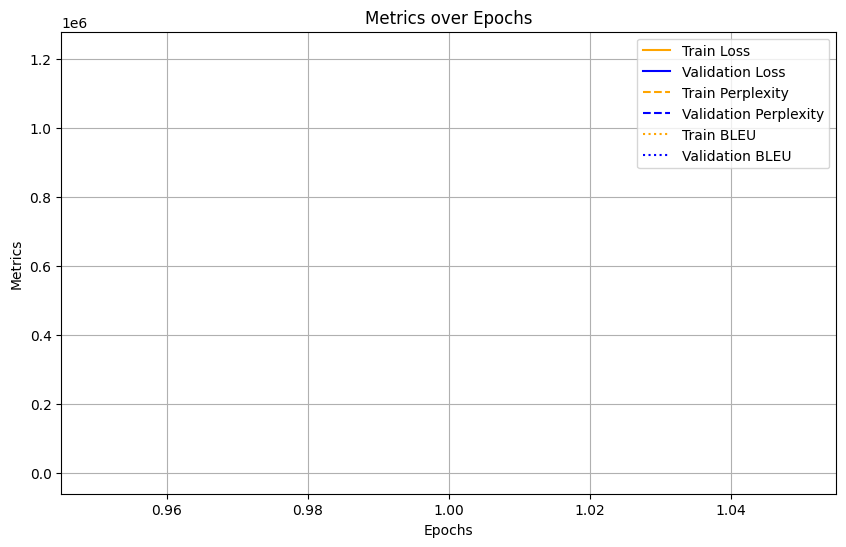

In [2]:
import os 
# Especificar las GPU 1 y 2 para ser visibles por PyTorch
#os.environ["CUDA_VISIBLE_DEVICES"] = "1,2"  
 
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load  # Asegurarse de que `evaluate` esté instalado
from pytorch_lightning.callbacks import ModelCheckpoint  # Añadir esta importación
from pytorch_lightning import Trainer
from datetime import datetime  # Importar datetime para obtener la fecha y hora actual
 
# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        self.dropout = nn.Dropout(0.2)  # Añadir Dropout para regularización

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Verificar y ajustar las dimensiones de visual_features
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        # Crear encoder_outputs usando BaseModelOutput
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)

        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Eliminar menciones 
    text = re.sub(r'@\w+', '', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=128):  # Ajustar max_length a 128
        self.data_dict = data_dict  # Diccionario con los datos
        self.embeddings_dict = embeddings_dict  # Diccionario con los embeddings
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        # Obtener los embeddings precalculados
        visual_features = self.embeddings_dict[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model  # Modelo que combina los embeddings y T5
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=128)  # Ajustar model_max_length a 128
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)  # Criterio de pérdida para ignorar índices de padding
        self.bleu_metric = load('bleu')  # Métrica BLEU para evaluar la calidad del texto generado
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])  # Guardar hiperparámetros, ignorando los no serializables
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        # Pasar las entradas al modelo y obtener los logits
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        # Pasar los datos al modelo y obtener las salidas
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida para monitoreo
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        # Realizar la predicción y desplazamiento cada N pasos
        if batch_idx % 100 == 0:
            # Predicción del siguiente token
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=128)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=128,
            num_beams = 4,
            early_stopping = True,
            no_repeat_ngram_size=3,  # Evitar la repetición de 3-gramas
            top_p=0.9,  # Muestra de núcleo con un umbral de probabilidad de 0.9
        )
        
        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        # Obtener los datos del batch y moverlos al dispositivo (CPU/GPU)
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=128,
            num_beams = 4,
            early_stopping = True,
            no_repeat_ngram_size=3,  # Evitar la repetición de 3-gramas
            top_p=0.9,  # Muestra de núcleo con un umbral de probabilidad de 0.9
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        # Calcular la puntuación BLEU
        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Para calcular la pérdida, necesitamos los logits de T5
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexidad
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexidad para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        # Configurar el optimizador
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)  # BLEU metric is not calculated during training_step
        self.train_outputs.clear()  # Clear the list after each epoch

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()  # Clear the list after each epoch

# Función principal
def main():
    # Cargar los datos desde archivos JSON y de texto
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    # Crear diccionarios de datos para los conjuntos de entrenamiento, validación y test
    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    # Cargar los embeddings precalculados
    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    # Cargar el tokenizador de T5
    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=128)  # Usar el comportamiento nuevo del tokenizador

    # Crear datasets para entrenamiento, validación y test
    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    # Reducir el tamaño del batch para reducir el uso de memoria
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Instanciar el modelo combinado y el modelo Lightning
    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)


    # Obtener la fecha y hora actual
    current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

    # Configuración para guardar los mejores checkpoints del modelo
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',  # Monitorear la pérdida de validación
        dirpath='checkpoints/clip-large/',  # Directorio para guardar los checkpoints
        filename=f'model-{current_time}-{{epoch:02d}}-{{val_loss:.2f}}',  # Formato del nombre de archivo
        save_top_k=1,  # Guardar los 3 mejores modelos
        mode='min',  # Modo mínimo para la pérdida
    )

    # Configurar el entrenador
    trainer = Trainer(
        max_epochs=1,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices=1 if torch.cuda.is_available() else 'cpu',  # Número de dispositivos (GPUs o CPUs)
        callbacks=[checkpoint_callback],  # Callback para guardar checkpoints
        precision=16,  # Usar precisión flotante de 16 bits durante el entrenamiento
        strategy='auto'  # Estrategia de mapeo de dispositivos automática
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    # Graficar las métricas
    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    # Encuentra la longitud mínima de las listas de métricas
    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    # Truncar todas las listas de métricas a la longitud mínima
    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()


if __name__ == "__main__":
    #torch.cuda.set_device(1)
    main()


Ahora vamos a cambiar:


max_length: 256 para proporcionar más espacio para generar texto, ya que los tweets pueden variar en longitud.
top_p y top_k: Se añadieron ambos parámetros para proporcionar una muestra más diversa y controlada.
no_repeat_ngram_size: Se incrementó a 3 para evitar repeticiones más largas.
label_smoothing: Se añadió para mejorar la robustez del modelo.
Número de épocas: Se incrementó a 3 para permitir que el modelo aprenda más de los datos

In [4]:
import os 
# Importar modelos y tokenizadores de transformers
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning import Trainer
from datetime import datetime

# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        self.dropout = nn.Dropout(0.2)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=256):
        self.data_dict = data_dict
        self.embeddings_dict = embeddings_dict
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data_dict)

    def __getitem__(self, idx):
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        visual_features = self.embeddings_dict[tweet_id]

        tweet_text = preprocess_text(tweet_info['tweet_text'])
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,
            "inputs": inputs.input_ids.squeeze(0)
        }

class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=256)
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)
        self.bleu_metric = load('bleu')
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        if batch_idx % 100 == 0:
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=256, top_p=0.9, top_k=50)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=256,
            num_beams=4,
            early_stopping=True,
            no_repeat_ngram_size=3,
            top_p=0.9,
            top_k=50
        )

        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        val_perplexity = torch.exp(val_loss)
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=256,
            num_beams=4,
            early_stopping=True,
            no_repeat_ngram_size=3,
            top_p=0.9,
            top_k=50
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        test_perplexity = torch.exp(test_loss)
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)
        self.train_outputs.clear()

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()

def main():
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=256)

    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',
        dirpath='checkpoints/clip-large/',
        filename=f'model-{current_time}-{{epoch:02d}}-{{val_loss:.2f}}',
        save_top_k=1,
        mode='min',
    )

    trainer = Trainer(
        max_epochs=3,
        accelerator='gpu',
        devices=1 if torch.cuda.is_available() else 'cpu',
        callbacks=[checkpoint_callback],
        precision=16,
        strategy='auto'
    )

    trainer.fit(lit_model, train_loader, val_loader)
    trainer.test(lit_model, test_loader)

    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    main()


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]

  | Name      | Type             | Params
-----------------------------------------------
0 | model     | VisionTextModel  | 222 M 
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
222 M     Trainable params
0         Non-trainable params
222 M     Total params
891.614   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: YALL WANT THIS TODAY 🦍💪🏽 STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.   🌎💫⛽️ 
Texto generado: STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.  STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.  STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.  STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.  STATWORLD 3600// LIKE A REAL NIGGA SHOULD PROD.
Step 100:
Texto original:  "You forced me! I play the seal of orochalos and I surrender." Falls down soulless. 
Texto generado: I play the seal of orochalos and I surrender!" "You forced me!" "You forced me!".. Falls down soulless.
Step 200:
Texto original:  nigga I said I’m more washed than u and that’s that nigga 
Texto generado: I said I’m more washed than u and that’s that nigga I said I’m more washed than u and that’s that nigga I said I’m more washed than u and that’s that nigga I said I’m more washed than u and that’s that nigga I said I’m more washed than u and that’s that nigga I said I’m more was
Step 300:
Texto origi

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Kat retweeting all my dyke-gi-oh shite from the bathroom 
Texto generado: I'm a dyke
Step 100:
Texto original: There is something about this nigga on Prison Break that just made me hella uncomfortable 😐 
Texto generado: Nigga
Step 200:
Texto original: Redneck fuck 
Texto generado: Redneck fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking fucking
Step 300:
Texto original: Faggot must wear a lock 😍😘😍😘😍😘😍😘 
Texto generado: Nigga
Step 400:
Texto original:  Does that say cunt 
Texto generado: Nigga I’m ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t
Step 500:
Texto original: Molly Maserati u got da contract..... Eat this nigga alive! Jacquees &amp; his bitch dreezy smeezy .they trippin! 
Texto generado: Nigga
Step 600:
Te

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]


Testing: |          | 0/? [00:00<?, ?it/s]

Intentaré corregir las métricas:

In [1]:
import os 
from transformers import T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
import json
import pickle
import re
import matplotlib.pyplot as plt
from evaluate import load
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning import Trainer
from datetime import datetime

# Definición del modelo que combina los embeddings precalculados y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-base")
        self.dropout = nn.Dropout(0.2)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        if visual_features.ndim == 2:
            visual_features = visual_features.unsqueeze(1)
        encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)
        t5_outputs = self.t5(
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            encoder_outputs=encoder_outputs,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=256):
        self.data_dict = data_dict
        self.embeddings_dict = embeddings_dict
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data_dict)

    def __getitem__(self, idx):
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]

        visual_features = self.embeddings_dict[tweet_id]
        tweet_text = preprocess_text(tweet_info['tweet_text'])
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,
            "inputs": inputs.input_ids.squeeze(0)
        }

class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=256)
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)
        self.bleu_metric = load('bleu')
        self.save_hyperparameters(ignore=["model", "tokenizer", "bleu_metric"])
        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.train_outputs = []
        self.val_outputs = []

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask):
        outputs = self.model(visual_features=visual_features, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask)
        return outputs.logits

    def training_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        labels = batch['labels'].to(self.device).long()

        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.train_outputs.append({'loss': loss})

        if batch_idx % 100 == 0:
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids, max_length=256, top_p=0.9, top_k=50)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=256,
            num_beams=4,
            early_stopping=True,
            no_repeat_ngram_size=3,
            top_p=0.9,
            top_k=50
        )

        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        val_perplexity = torch.exp(val_loss)
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss

    def test_step(self, batch, batch_idx):
        visual_features = batch['visual_features'].to(self.device)
        labels = batch['labels'].to(self.device).long()

        generated_ids = self.model.t5.generate(
            encoder_outputs=BaseModelOutput(last_hidden_state=visual_features.unsqueeze(0)),
            decoder_start_token_id=self.tokenizer.pad_token_id,
            max_length=256,
            num_beams=4,
            early_stopping=True,
            no_repeat_ngram_size=3,
            top_p=0.9,
            top_k=50
        )
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
        reference_text = self.tokenizer.decode(labels[0].tolist(), skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        decoder_input_ids = batch['decoder_input_ids'].to(self.device).long()
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device).long()
        outputs = self.model(visual_features, decoder_input_ids, decoder_attention_mask, labels=labels)
        logits = outputs.logits

        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        test_perplexity = torch.exp(test_loss)
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)
        self.train_outputs.clear()

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()

def main():
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    with open('image_embeddings.pkl', 'rb') as f:
        embeddings_dict = pickle.load(f)

    tokenizer = T5Tokenizer.from_pretrained('t5-base', legacy=False, model_max_length=256)

    train_dataset = MMHS150KDataset(dict_train, embeddings_dict, tokenizer)
    val_dataset = MMHS150KDataset(dict_val, embeddings_dict, tokenizer)
    test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',
        dirpath='checkpoints/clip-large/',
        filename=f'model-{current_time}-{{epoch:02d}}-{{val_loss:.2f}}',
        save_top_k=1,
        mode='min',
    )

    trainer = Trainer(
        max_epochs=3,
        accelerator='gpu',
        devices=1 if torch.cuda.is_available() else 'cpu',
        callbacks=[checkpoint_callback],
        precision=16,
        strategy='auto'
    )

    trainer.fit(lit_model, train_loader, val_loader)
    trainer.test(lit_model, test_loader)

    epochs = range(1, len(lit_model.train_metrics['loss']) + 1)

    min_length = min(len(lit_model.train_metrics['loss']), len(lit_model.val_metrics['loss']),
                    len(lit_model.train_metrics['perplexity']), len(lit_model.val_metrics['perplexity']),
                    len(lit_model.train_metrics['bleu']), len(lit_model.val_metrics['bleu']))

    train_loss = lit_model.train_metrics['loss'][:min_length]
    val_loss = lit_model.val_metrics['loss'][:min_length]
    train_perplexity = lit_model.train_metrics['perplexity'][:min_length]
    val_perplexity = lit_model.val_metrics['perplexity'][:min_length]
    train_bleu = lit_model.train_metrics['bleu'][:min_length]
    val_bleu = lit_model.val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    main()


[2024-06-30 11:13:29,403] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


2024-06-30 11:13:30.192716: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-30 11:13:30.262766: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-30 11:13:31.126003: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/javiermo/.local/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download,

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:397: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 16. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_d

Training: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: Judge set to rule on change of venue motion in Van Dyke trial:  
Texto generado: in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge set to rule on change of venue motion in Van Dyke trial: Judge
Step 100:
Texto original: “You ain’t shit” “You’ll never change” “You’re such a liar” “I’ll find a new nigga”    
Texto generado: “You’re such a liar” “You’ll never change” “I’ll find a new nigga” “You’re such a liar” “I’ll find a new nigga” “You’re such a liar” “You’re such a liar” “You’re such a liar” “You’re such a liar” “You’re such a
Step 200:
Texto original: nigga walked in on me in the stall and asked me if i was done 

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 7. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Step 0:
Texto original:  But aren’t stupid and retarded .... like the same thing??? Okay 
Texto generado: Nigga
Step 100:
Texto original: Another slayed shoot with  🔥 Happy birthday with yo crazy ass!!! You my nigga tho fasho ✊🏾  #klicksbykam 📸 
Texto generado: When you see this picture with nigga
Step 200:
Texto original:  Big nigga thread 👀 let me sliiideee in 
Texto generado: 
Step 300:
Texto original: Car Windows 2-0 Silly Twat 
Texto generado: 


/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


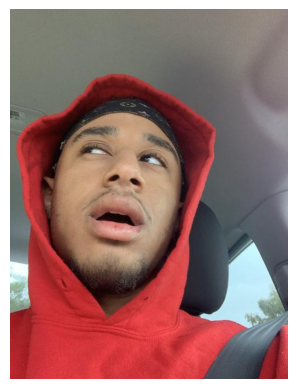

Ejemplo 8116:
Texto real:  @amayaj11 Nigga whaaaa https://t.co/ofcybB6IPP
Texto generado:  This nigga



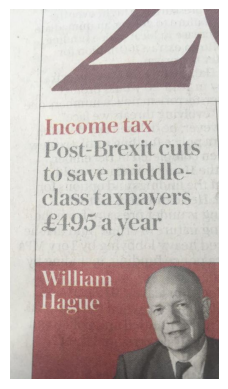

Ejemplo 9366:
Texto real:  Cheers @PhilipHammondUK you big cunt. Nice to know you saved yourself a few hundred pounds. https://t.co/GccWQ1bbOB
Texto generado:  A twat



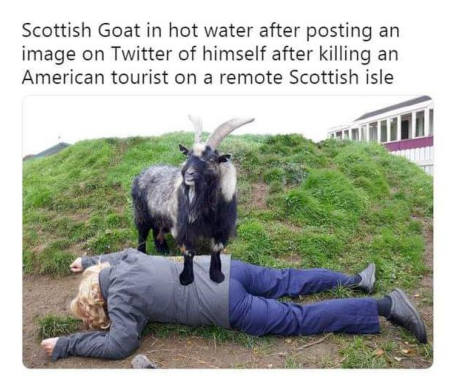

Ejemplo 3805:
Texto real:  Payback for the Yanky hunter cunt https://t.co/DQV9IIiYLo
Texto generado:  Fucking cunt



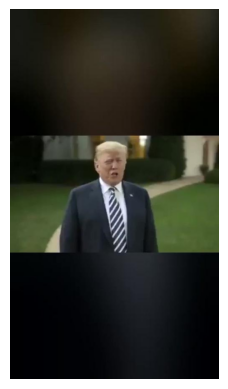

Ejemplo 201:
Texto real:  is this bie retarded https://t.co/egBhlVQpvu
Texto generado:  This nigga ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’t ain’s nigga



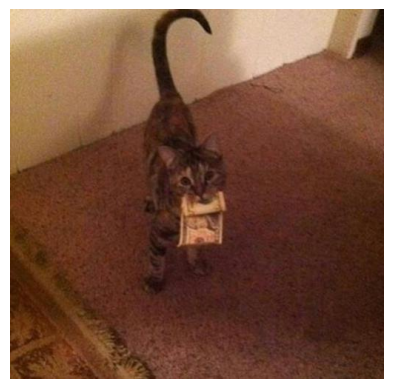

Ejemplo 1628:
Texto real:  this retard richer than me https://t.co/BImCmZpize
Texto generado:  Nigga



: 

In [5]:
import os
import random
import json
from transformers import T5Tokenizer
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from transformers.modeling_outputs import BaseModelOutput
import pickle

# Definición del dataset (usando embeddings precalculados)
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, embeddings_dict, tokenizer, max_length=512):
        self.data_dict = data_dict
        self.embeddings_dict = embeddings_dict
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data_dict)

    def __getitem__(self, idx):
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        visual_features = self.embeddings_dict[tweet_id]
        tweet_text = tweet_info['tweet_text']

        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        return {
            "visual_features": torch.tensor(visual_features),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,
            "inputs": inputs.input_ids.squeeze(0)
        }

def preprocess_text(text):
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

def load_data(base_path):
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()
    return data, id_test

def show_image(image):
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5):
    lit_model.eval()
    lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')
    examples = random.sample(range(len(test_dataset)), num_examples)

    for i in examples:
        sample = test_dataset[i]
        visual_features = sample['visual_features'].unsqueeze(0).to(lit_model.device)
        tweet_id = list(test_dataset.data_dict.keys())[i]
        tweet_text = data[tweet_id]['tweet_text']

        original_image_path = f"./img_resized/{tweet_id}.jpg"
        original_image = Image.open(original_image_path).convert('RGB')

        show_image(original_image)

        with torch.no_grad():
            # Nos aseguramos de que visual_features tenga las dimensiones correctas
            if visual_features.ndimension() == 2:
                visual_features = visual_features.unsqueeze(0)
            
            encoder_outputs = BaseModelOutput(last_hidden_state=visual_features)
            generated_ids = lit_model.model.t5.generate(
                encoder_outputs=encoder_outputs,
                max_length=128,
                num_beams=4,
                early_stopping=True
            )
            generated_text = tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        print(f"Ejemplo {i+1}:")
        print("Texto real: ", tweet_text)
        print("Texto generado: ", generated_text)
        print()

base_path = "./"
data, id_test = load_data(base_path)
tokenizer = T5Tokenizer.from_pretrained('t5-base', model_max_length=512)

with open('image_embeddings.pkl', 'rb') as f:
    embeddings_dict = pickle.load(f)

dict_test = {x: data[x] for x in id_test if x in data}
test_dataset = MMHS150KDataset(dict_test, embeddings_dict, tokenizer)

model = VisionTextModel()
checkpoint_path = "checkpoints/clip-large/model-20240630-102248-epoch=00-val_loss=0.30.ckpt"
lit_model = LitVisionTextTransformer.load_from_checkpoint(checkpoint_path, model=model)
lit_model.eval()
lit_model.to('cuda' if torch.cuda.is_available() else 'cpu')

test_examples(lit_model, tokenizer, test_dataset, data, num_examples=5)


# 🟢 CLIP LARGE + T5 LARGE

- Voy a intentar no alejarme tanto del esquema de código inicial. Dejo clip como paceholder "None" (porque en el futuro realmente debe existir, aunque no lo cargue ahora en memoria) y me baso en el código de t5 base clip base
- Uso t5 large, cuantizado a 4 bits para que quepa
- utilizo los embeddings precalculados, como antes
- intento corregir el cálculo de métricas

In [ ]:
# Importar modelos y tokenizadores de transformers
from transformers import CLIPModel, CLIPTokenizer, T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from torch.utils.data import Dataset, DataLoader
import json
import os
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
import re
import matplotlib.pyplot as plt
import pickle

# Importar la métrica BLEU
from evaluate import load

# Definición del modelo que combina CLIP y T5
class VisionTextModel(nn.Module):
    def _init_(self):
        super(VisionTextModel, self)._init_()
        # Placeholder para el modelo CLIP que no se cargará en memoria
        self.clip = None
        
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-large")
        
        # Cambiar la dimensión de 768 (salida de CLIP) a 1024 (entrada de T5-large)
        self.linear = nn.Linear(768, 1024)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Asegurarse de que las características visuales estén en float32
        visual_features = visual_features.float()
        
        # Adaptar las dimensiones de las características de CLIP de 768 a 1024
        adapted_encoder_outputs = self.linear(visual_features)
        
        # Asegurarse de que adapted_encoder_outputs tiene las dimensiones correctas
        if adapted_encoder_outputs.ndimension() == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)
        
        encoder_outputs = BaseModelOutput(last_hidden_state=adapted_encoder_outputs)
        
        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            encoder_outputs=encoder_outputs,
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def _init_(self, data_dict, img_dir, tokenizer, embeddings_file, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.img_dir = img_dir  # Directorio donde se encuentran las imágenes
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos
        # Cargar los embeddings pre-calculados
        with open(embeddings_file, 'rb') as f:
            self.embeddings = pickle.load(f)

    def _len_(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def _getitem_(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        
        # Obtener el embedding de la imagen correspondiente al tweet
        image_embedding = self.embeddings[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "pixel_values": torch.tensor(image_embedding, dtype=torch.float32),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def _init_(self, model):
        super(LitVisionTextTransformer, self)._init_()
        self.model = model
        self.tokenizer = T5Tokenizer.from_pretrained('t5-large')
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)
        self.bleu_metric = load("bleu")  # Correctamente cargar la métrica BLEU

        self.train_outputs = []
        self.val_outputs = []

        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': []}

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask, labels):
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        return outputs

    def training_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        outputs = self(pixel_values, decoder_input_ids, decoder_attention_mask, labels)
        logits = outputs.logits

        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.train_outputs.append({'loss': loss})

        # Teacher forcing para la generación de texto
        if batch_idx % 100 == 0:
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        # Forward pass para obtener los logits del decodificador
        outputs = self.model(visual_features=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            input_ids=decoder_input_ids,
            attention_mask=decoder_attention_mask,
            max_length=128,
            num_beams=4,
            early_stopping=True
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Aplanar la lista de listas
        flattened_labels = [item for sublist in labels.squeeze().tolist() for item in sublist]
        
        reference_text = self.tokenizer.decode(flattened_labels, skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexity
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexity para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_perplexity': val_perplexity})

        return val_loss                                 

    def test_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        # Forward pass para obtener los logits del decodificador
        outputs = self.model(visual_features=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            input_ids=decoder_input_ids,
            attention_mask=decoder_attention_mask,
            max_length=128,
            num_beams=4,
            early_stopping=True
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Aplanar la lista de listas
        flattened_labels = [item for sublist in labels.squeeze().tolist() for item in sublist]

        reference_text = self.tokenizer.decode(flattened_labels, skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
        else:
            bleu_score = 0.0

        # Registrar la puntuación BLEU para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexity
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexity para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)
        self.train_outputs.clear()

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_outputs.clear()

# Función principal
def main():
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    tokenizer = T5Tokenizer.from_pretrained('t5-large', legacy=False)
    img_dir = "./img_resized"

    train_dataset = MMHS150KDataset(dict_train, img_dir, tokenizer, 'image_embeddings.pkl')
    val_dataset = MMHS150KDataset(dict_val, img_dir, tokenizer, 'image_embeddings.pkl')
    test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer, 'image_embeddings.pkl')

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',
        dirpath='checkpoints/t5large/',
        filename='model-{epoch:02d}-{val_loss:.2f}',
        save_top_k=3,
        mode='min',
    )

    trainer = Trainer(
        max_epochs=1,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices='auto',  # Seleccionar automáticamente el número de GPUs disponibles
        callbacks=[checkpoint_callback],  # Registrar el callback de punto de control
        strategy='auto',  # Estrategia de mapeo de dispositivos automática
        precision=32  # Usar precisión de 32 bits
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)
    # Probar el modelo
    trainer.test(lit_model, test_loader)

    train_metrics = lit_model.train_metrics
    val_metrics = lit_model.val_metrics

    min_length = min(len(train_metrics['loss']), len(val_metrics['loss']))

    train_loss = train_metrics['loss'][:min_length]
    val_loss = val_metrics['loss'][:min_length]
    train_perplexity = train_metrics['perplexity'][:min_length]
    val_perplexity = val_metrics['perplexity'][:min_length]
    train_bleu = train_metrics['bleu'][:min_length]
    val_bleu = val_metrics['bleu'][:min_length]
    epochs = range(1, min_length + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_loss, 'orange', label='Train Loss')
    plt.plot(epochs, val_loss, 'blue', label='Validation Loss')
    plt.plot(epochs, train_perplexity, 'orange', linestyle='dashed', label='Train Perplexity')
    plt.plot(epochs, val_perplexity, 'blue', linestyle='dashed', label='Validation Perplexity')
    plt.plot(epochs, train_bleu, 'orange', linestyle='dotted', label='Train BLEU')
    plt.plot(epochs, val_bleu, 'blue', linestyle='dotted', label='Validation BLEU')
    plt.xlabel('Epochs')
    plt.ylabel('Metrics')
    plt.title('Metrics over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

if _name_ == "_main_":
    main()

Se borró el output, pero fue:


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_bleu         │   0.008892709389328957    │
│         test_loss         │    0.5042988657951355     │
│      test_perplexity      │    1.6601749658584595  

# 🔴 Iteración sobre la arquitectura 

Capas intermedias, normalizaciones... 
Resultado: Más sobreajuste

Ahora vamos a probar a añadir alguna capa intermedia, normalización etc

Cambios Introducidos:

- Batch Normalization: Normalizamos las características extraídas por CLIP para estabilizar el entrenamiento.

- Capa de Transformador Adicional: Añadimos una capa de transformador adicional para aprender representaciones más ricas y adecuadas antes de pasarlas al modelo T5.

Modificaciones:


- Constructor

Añadido en el constructor:
self.batch_norm = nn.BatchNorm1d(768)

encoder_layer = nn.TransformerEncoderLayer(d_model=768, nhead=8)
self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=1)

- Forward

Cambiado en el método forward para incluir Batch Normalization y Transformador:
visual_features = self.batch_norm(visual_features)

visual_features = self.transformer_encoder(visual_features.unsqueeze(1)).squeeze(1)





También añadiré la métrica ROUGE

In [1]:
import os

# Hacer visibles solo las GPUs 1 y 2
os.environ["CUDA_VISIBLE_DEVICES"] = "1,2"

import torch

# Ahora PyTorch solo verá las GPUs 1 y 2
print(torch.cuda.device_count())  # Debería imprimir 2
print(torch.cuda.get_device_name(0))  # Nombre de la primera GPU visible (anteriormente GPU 1)
print(torch.cuda.get_device_name(1))  # Nombre de la segunda GPU visible (anteriormente GPU 2)

2
NVIDIA GeForce RTX 3090
NVIDIA GeForce RTX 3090


In [2]:
%pip install rouge_score

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


/home/javiermo/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/javiermo/.local/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2024-07-05 00:20:25.308507: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-05 00:20:25.382870: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To en

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/javiermo/.local/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

/home/javiermo/.local/lib/python3.10/site-packages/transformers/generation/utils.py:1249: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Step 0:
Texto original: [USR] @ me nigga ik u just saw my snap smh 
Texto generado: i m nigga ik u just saw my snap
Step 100:
Texto original: [USR] [USR] You sir are retard 
Texto generado: ed. You retard.
Step 200:
Texto original: CFD prepares for Van Dyke trial verdict  
Texto generado: . CFD prepares for Van Dyke trial verdict.
Step 300:
Texto original: And now on my way to meet some boot-loving faggot! 😈😈😈 
Texto generado: 
Step 400:
Texto original: [USR] [USR] [USR] You’re a magnificent cunt.. 
Texto generado: [USR] [USR] [USR] [USR] [US
Step 500:
Texto original: have you ever just fell in love with a nigga😟but never told him because you was scared of his reaction😰😰 
Texto generado: but he never told youbut you never told himbut you
Step 600:
Texto original: next time you f*gs start sucking [USR]'s pickle for owning the libs remember this retard follows [USR] 
Texto generado: s libs. So's lead. So next time you f*
Step 700:
Texto original: What a scam and brain dead retard when I 

Validation: |          | 0/? [00:00<?, ?it/s]

Step 0:
Texto original: [USR] Bro when Tom kicks the nigga in the chest 🤣🤣 
Texto generado: nigga
Step 100:
Texto original: Fuck Twitter. Been saying Faggot my whole life and I’ll say it here too Faggotts #OregonCoastDeathRow 
Texto generado: ts fuck twitter. #OregonCoastDeath
Step 200:
Texto original: [USR] Nigga I’m not gone even tell u price lol I wanted to cop n was like 
Texto generado: nigga i’m a dyke n i
Step 300:
Texto original: [USR] I’m the only nigga that gets to play my baby😘🤷🏾‍♂️ 
Texto generado: 
Step 400:
Texto original: Butters cunt 
Texto generado: s cunt
Step 500:
Texto original: We ain't quick to leave a nigga on the back street   Opps 
Texto generado: nigga ain't ain't ain'
Step 600:
Texto original: All That Shit U Was Saying Talm Bout You Was Go Abort A Nigga, WHAT ABOUT NOW BITCH! 
Texto generado: U Be Saying Nigga, Is U Saying Nigga?
Step 700:
Texto original: Shaggy haired twat 
Texto generado: a shaved twat.. a twat
Step 800:
Texto original: I’ma real nigga, si

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=2` reached.


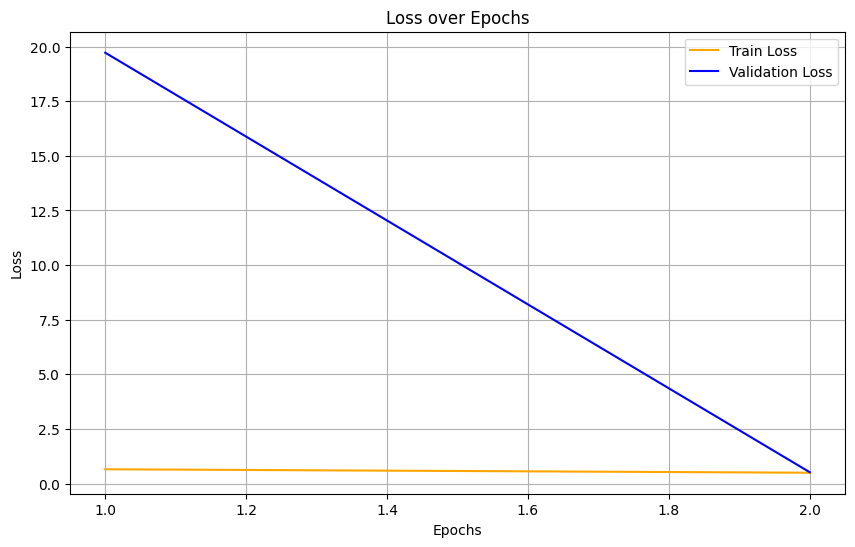

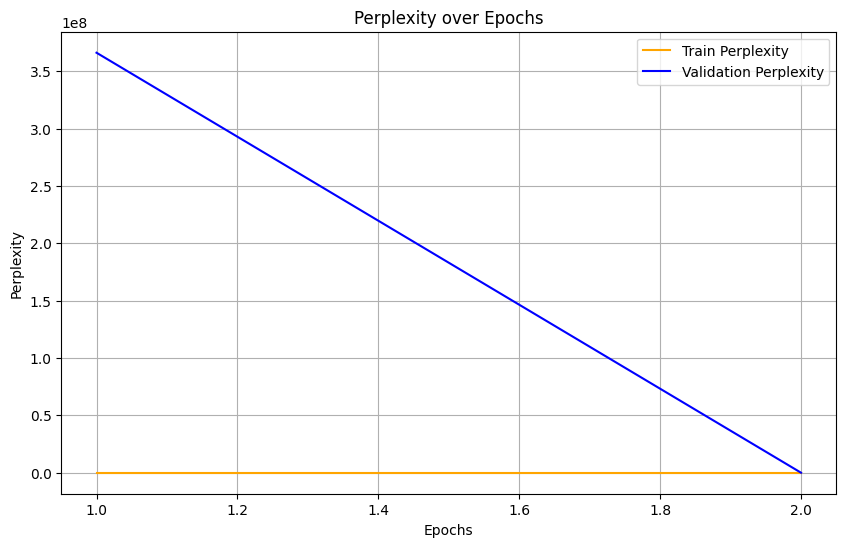

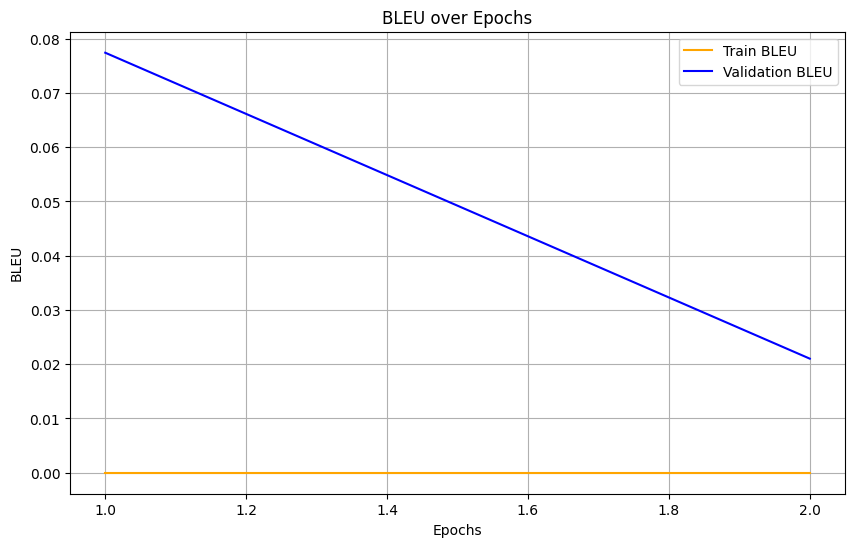

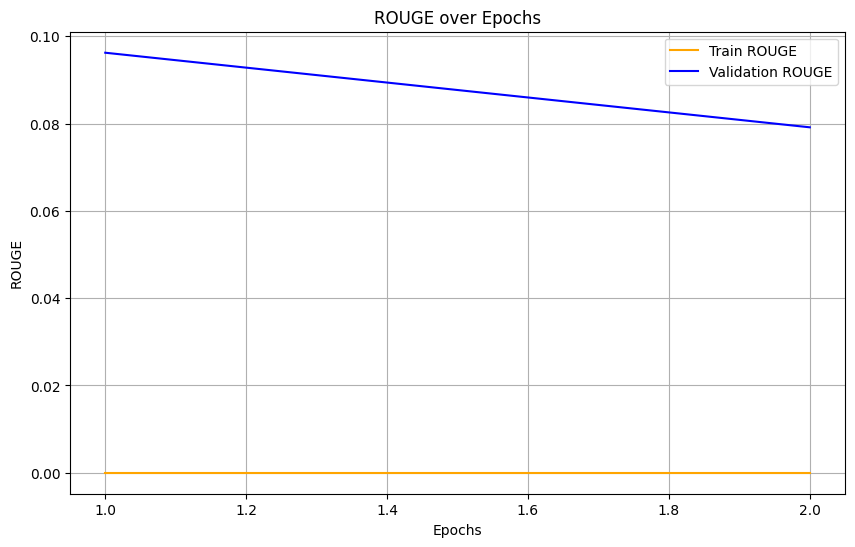

In [3]:
# Importar modelos y tokenizadores de transformers
from transformers import CLIPModel, CLIPTokenizer, T5ForConditionalGeneration, T5Tokenizer
from transformers.modeling_outputs import BaseModelOutput
import torch
import torch.nn as nn
import pytorch_lightning as pl
from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from torch.utils.data import Dataset, DataLoader
import json
import os
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
import re
import matplotlib.pyplot as plt
import pickle

# Importar métricas BLEU y ROUGE
from evaluate import load

# Definición del modelo que combina CLIP y T5
class VisionTextModel(nn.Module):
    def __init__(self):
        super(VisionTextModel, self).__init__()
        # Placeholder para el modelo CLIP que no se cargará en memoria
        self.clip = None
        
        # Cargar modelo T5 preentrenado
        self.t5 = T5ForConditionalGeneration.from_pretrained("t5-large")
        
        # Cambiar la dimensión de 768 (salida de CLIP) a 1024 (entrada de T5-large)
        self.linear = nn.Linear(768, 1024)

        # Añadido: Batch Normalization
        self.batch_norm = nn.BatchNorm1d(768)
        
        # Añadido: Capa de Transformador adicional
        encoder_layer = nn.TransformerEncoderLayer(d_model=768, nhead=8)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=1)

    def forward(self, visual_features, decoder_input_ids, decoder_attention_mask=None, labels=None):
        # Asegurarse de que las características visuales estén en float32
        visual_features = visual_features.float()
        
        # Añadido: Aplicar Batch Normalization
        visual_features = self.batch_norm(visual_features)
        
        # Añadido: Pasar por la capa de Transformador adicional
        visual_features = self.transformer_encoder(visual_features.unsqueeze(1)).squeeze(1)
        
        # Adaptar las dimensiones de las características de CLIP de 768 a 1024
        adapted_encoder_outputs = self.linear(visual_features)
        
        # Asegurarse de que adapted_encoder_outputs tiene las dimensiones correctas
        if adapted_encoder_outputs.ndimension() == 2:
            adapted_encoder_outputs = adapted_encoder_outputs.unsqueeze(1)
        
        encoder_outputs = BaseModelOutput(last_hidden_state=adapted_encoder_outputs)
        
        # Pasar las características visuales adaptadas al modelo T5 como entrada del decodificador
        t5_outputs = self.t5(
            encoder_outputs=encoder_outputs,
            decoder_input_ids=decoder_input_ids,
            decoder_attention_mask=decoder_attention_mask,
            labels=labels
        )
        return t5_outputs

def preprocess_text(text):
    # Eliminar enlaces
    text = re.sub(r'http\S+', '', text)
    # Sustituir menciones por [USR]
    text = re.sub(r'@\w+', '[USR]', text)
    return text

# Definición del dataset
class MMHS150KDataset(Dataset):
    def __init__(self, data_dict, img_dir, tokenizer, embeddings_file, max_length=128):
        self.data_dict = data_dict  # Diccionario con los datos
        self.img_dir = img_dir  # Directorio donde se encuentran las imágenes
        self.tokenizer = tokenizer  # Tokenizador de T5
        self.max_length = max_length  # Longitud máxima de los textos
        # Cargar los embeddings pre-calculados
        with open(embeddings_file, 'rb') as f:
            self.embeddings = pickle.load(f)

    def __len__(self):
        return len(self.data_dict)  # Devolver el número de elementos en el dataset

    def __getitem__(self, idx):
        # Obtener el ID del tweet
        tweet_id = list(self.data_dict.keys())[idx]
        tweet_info = self.data_dict[tweet_id]
        
        # Obtener el embedding de la imagen correspondiente al tweet
        image_embedding = self.embeddings[tweet_id]

        # Tokenizar el texto del tweet
        tweet_text = preprocess_text(tweet_info['tweet_text'])  # Preprocesar el texto
        inputs = self.tokenizer(tweet_text, return_tensors="pt", max_length=self.max_length, padding='max_length', truncation=True)

        # Clonar los IDs de entrada para las etiquetas y los IDs de entrada del decodificador
        labels = inputs.input_ids.squeeze(0).clone()
        decoder_input_ids = inputs.input_ids.squeeze(0).clone()

        # Desplazar decoder_input_ids a la derecha y reemplazar el último token con pad_token_id
        decoder_input_ids = torch.cat([torch.tensor([self.tokenizer.pad_token_id]), decoder_input_ids[:-1]])

        # Devolver el diccionario con las entradas y etiquetas
        return {
            "pixel_values": torch.tensor(image_embedding, dtype=torch.float32),
            "decoder_input_ids": decoder_input_ids,
            "decoder_attention_mask": inputs.attention_mask.squeeze(0),
            "labels": labels,
            "tweet_text": tweet_text,  # Añadir el texto original
            "inputs": inputs.input_ids.squeeze(0)  # Añadir los IDs de entrada tokenizados
        }

# Definición del modelo de entrenamiento usando PyTorch Lightning
class LitVisionTextTransformer(pl.LightningModule):
    def __init__(self, model):
        super(LitVisionTextTransformer, self).__init__()
        self.model = model
        self.tokenizer = T5Tokenizer.from_pretrained('t5-large')
        self.criterion = nn.CrossEntropyLoss(ignore_index=-100)
        self.bleu_metric = load("bleu")  # Correctamente cargar la métrica BLEU
        self.rouge_metric = load("rouge")  # Añadido: Cargar la métrica ROUGE

        self.train_outputs = []
        self.val_outputs = []

        self.train_metrics = {'loss': [], 'perplexity': [], 'bleu': [], 'rouge': []}
        self.val_metrics = {'loss': [], 'perplexity': [], 'bleu': [], 'rouge': []}

    def forward(self, pixel_values, decoder_input_ids, decoder_attention_mask, labels):
        outputs = self.model(pixel_values, decoder_input_ids, decoder_attention_mask, labels=labels)
        return outputs

    def training_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        outputs = self(pixel_values, decoder_input_ids, decoder_attention_mask, labels)
        logits = outputs.logits

        loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        self.train_outputs.append({'loss': loss})

        # Teacher forcing para la generación de texto
        if batch_idx % 100 == 0:
            generated_ids = self.model.t5.generate(input_ids=decoder_input_ids)
            generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)
            reference_text = batch['tweet_text'][0]

            print(f"Step {batch_idx}:")
            print(f"Texto original: {reference_text}")
            print(f"Texto generado: {generated_text}")

        return loss

    def validation_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        # Forward pass para obtener los logits del decodificador
        outputs = self.model(visual_features=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            input_ids=decoder_input_ids,
            attention_mask=decoder_attention_mask,
            max_length=256,
            num_beams=6,
            early_stopping=True
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Aplanar la lista de listas
        flattened_labels = [item for sublist in labels.squeeze().tolist() for item in sublist]
        
        reference_text = self.tokenizer.decode(flattened_labels, skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
            rouge_score = self.rouge_metric.compute(predictions=[generated_text], references=[[reference_text]])['rougeLsum']
        else:
            bleu_score = 0.0
            rouge_score = 0.0

        # Registrar la puntuación BLEU y ROUGE para monitoreo
        self.log('val_bleu', bleu_score, on_epoch=True, prog_bar=True)
        self.log('val_rouge', rouge_score, on_epoch=True, prog_bar=True)

        # Calcular la pérdida comparando los logits con las etiquetas
        val_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de validación para monitoreo
        self.log('val_loss', val_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexity
        val_perplexity = torch.exp(val_loss)
        # Registrar la Perplexity para monitoreo
        self.log('val_perplexity', val_perplexity, on_epoch=True, prog_bar=True)

        self.val_outputs.append({'val_loss': val_loss, 'val_bleu': bleu_score, 'val_rouge': rouge_score, 'val_perplexity': val_perplexity})

        return val_loss                                 

    def test_step(self, batch, batch_idx):
        pixel_values = batch['pixel_values'].to(self.device)
        labels = batch['labels'].to(self.device)
        decoder_input_ids = batch['decoder_input_ids'].to(self.device)
        decoder_attention_mask = batch['decoder_attention_mask'].to(self.device)

        # Forward pass para obtener los logits del decodificador
        outputs = self.model(visual_features=pixel_values, decoder_input_ids=decoder_input_ids, decoder_attention_mask=decoder_attention_mask, labels=labels)
        logits = outputs.logits

        # Generar texto basado en las características visuales
        generated_ids = self.model.t5.generate(
            input_ids=decoder_input_ids,
            attention_mask=decoder_attention_mask,
            max_length=256,
            num_beams=6,
            early_stopping=True
        )

        # Calcular la puntuación BLEU
        generated_text = self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

        # Aplanar la lista de listas
        flattened_labels = [item for sublist in labels.squeeze().tolist() for item in sublist]

        reference_text = self.tokenizer.decode(flattened_labels, skip_special_tokens=True)

        if len(generated_text) > 0 and len(reference_text) > 0:
            bleu_score = self.bleu_metric.compute(predictions=[generated_text], references=[[reference_text]])['bleu']
            rouge_score = self.rouge_metric.compute(predictions=[generated_text], references=[[reference_text]])['rougeLsum']
        else:
            bleu_score = 0.0
            rouge_score = 0.0

        # Registrar la puntuación BLEU y ROUGE para monitoreo
        self.log('test_bleu', bleu_score, on_epoch=True, prog_bar=True)
        self.log('test_rouge', rouge_score, on_epoch=True, prog_bar=True)

        # Calcular la pérdida comparando los logits con las etiquetas
        test_loss = self.criterion(logits.view(-1, logits.size(-1)), labels.view(-1))
        # Registrar la pérdida de test para monitoreo
        self.log('test_loss', test_loss, on_epoch=True, prog_bar=True)

        # Calcular la Perplexity
        test_perplexity = torch.exp(test_loss)
        # Registrar la Perplexity para monitoreo
        self.log('test_perplexity', test_perplexity, on_epoch=True, prog_bar=True)

        return test_loss

    def configure_optimizers(self):
        return torch.optim.AdamW(self.parameters(), lr=5e-5)

    def on_train_epoch_end(self):
        avg_loss = torch.stack([x['loss'] for x in self.train_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        self.train_metrics['loss'].append(avg_loss.item())
        self.train_metrics['perplexity'].append(avg_perplexity.item())
        self.train_metrics['bleu'].append(0.0)
        self.train_metrics['rouge'].append(0.0)  # Añadido: Placeholder para ROUGE en entrenamiento
        self.train_outputs.clear()

    def on_validation_epoch_end(self):
        avg_loss = torch.stack([x['val_loss'] for x in self.val_outputs]).mean()
        avg_perplexity = torch.exp(avg_loss)
        avg_bleu = torch.tensor([x['val_bleu'] for x in self.val_outputs]).mean()
        avg_rouge = torch.tensor([x['val_rouge'] for x in self.val_outputs]).mean()  # Añadido: Promedio de ROUGE
        self.val_metrics['loss'].append(avg_loss.item())
        self.val_metrics['perplexity'].append(avg_perplexity.item())
        self.val_metrics['bleu'].append(avg_bleu.item())
        self.val_metrics['rouge'].append(avg_rouge.item())  # Añadido: Guardar métrica ROUGE
        self.val_outputs.clear()

# Función principal
def main():
    base_path = "./"
    with open(f'{base_path}/MMHS150K_GT.json', 'r') as f:
        data = json.load(f)

    with open(f'{base_path}/splits/train_ids.txt', 'r') as f:
        id_train = f.read().split()
    with open(f'{base_path}/splits/val_ids.txt', 'r') as f:
        id_val = f.read().split()
    with open(f'{base_path}/splits/test_ids.txt', 'r') as f:
        id_test = f.read().split()

    dict_train = {x: data[x] for x in id_train if x in data}
    dict_val = {x: data[x] for x in id_val if x in data}
    dict_test = {x: data[x] for x in id_test if x in data}

    tokenizer = T5Tokenizer.from_pretrained('t5-large', legacy=False)
    img_dir = "./img_resized"

    train_dataset = MMHS150KDataset(dict_train, img_dir, tokenizer, 'image_embeddings.pkl')
    val_dataset = MMHS150KDataset(dict_val, img_dir, tokenizer, 'image_embeddings.pkl')
    test_dataset = MMHS150KDataset(dict_test, img_dir, tokenizer, 'image_embeddings.pkl')

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

    model = VisionTextModel()
    lit_model = LitVisionTextTransformer(model)

    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',
        dirpath='checkpoints/t5large/',
        filename='model-{epoch:02d}-{val_loss:.2f}',
        save_top_k=2,
        mode='min',
    )

    trainer = Trainer(
        max_epochs=2,  # Número de épocas de entrenamiento
        accelerator='gpu',  # Usar GPU si está disponible
        devices='auto',  # Seleccionar automáticamente el número de GPUs disponibles
        callbacks=[checkpoint_callback],  # Registrar el callback de punto de control
        strategy='auto',  # Estrategia de mapeo de dispositivos automática
        precision=32  # Usar precisión de 32 bits
    )

    # Entrenar el modelo
    trainer.fit(lit_model, train_loader, val_loader)

    # Imprimir resultado
    train_metrics = lit_model.train_metrics
    val_metrics = lit_model.val_metrics

    min_length = min(len(train_metrics['loss']), len(val_metrics['loss']))

    train_loss = train_metrics['loss'][:min_length]
    val_loss = val_metrics['loss'][:min_length]
    train_perplexity = train_metrics['perplexity'][:min_length]
    val_perplexity = val_metrics['perplexity'][:min_length]
    train_bleu = train_metrics['bleu'][:min_length]
    val_bleu = val_metrics['bleu'][:min_length]
    train_rouge = train_metrics['rouge'][:min_length]
    val_rouge = val_metrics['rouge'][:min_length]
    epochs = range(1, min_length + 1)

    # Crear gráficos separados para cada métrica
    metrics = {
        'Loss': (train_loss, val_loss),
        'Perplexity': (train_perplexity, val_perplexity),
        'BLEU': (train_bleu, val_bleu),
        'ROUGE': (train_rouge, val_rouge)
    }

    for metric_name, (train_values, val_values) in metrics.items():
        plt.figure(figsize=(10, 6))
        plt.plot(epochs, train_values, 'orange', label=f'Train {metric_name}')
        plt.plot(epochs, val_values, 'blue', label=f'Validation {metric_name}')
        plt.xlabel('Epochs')
        plt.ylabel(metric_name)
        plt.title(f'{metric_name} over Epochs')
        plt.legend()
        plt.grid(True)
        plt.show()

if __name__ == "__main__":
    main()
